#**DETECCIÓN DE LA PISTA DE TENIS**

En este *notebook* se presenta el proceso completo para la **detección y refinamiento de las líneas de una pista de tenis** a partir de vídeo. El objetivo principal es estimar de forma precisa la geometría de la pista mediante la identificación de sus estructuras lineales y *keypoints* relevantes, y utilizar esta información para calcular una **homografía final** que relacione la imagen original con un plano de referencia en vista cenital.

In [ ]:
!pip install -q gdown
!pip install -q torchinfo

In [ ]:
!pip install kaggle opencv-python matplotlib numpy torch torchvision tqdm fastai

## **DATASET: TRACKNET**

Estas primeras celdas de código son **comunes** en el resto de notebooks, encargadas de **cargar y preparar el conjunto de datos** que se utilizará a lo largo del proyecto para **validar** tanto **el comportamiento de los modelos entrenados** como **las técnicas de procesado de imágenes** implementadas.

Para facilitar el acceso al dataset, que se encuentra en la plataforma **Kaggle**, se establece el acceso a Google Drive, donde se va a guardar la **clave de autenticación de usuario** (`kaggle.json`) de dicha plataforma para poder descargarlo directamente desde sus servidores.




In [ ]:
from google.colab import drive
import os

drive.mount('/content/drive')

!mkdir -p ~/.kaggle

!cp /content/drive/MyDrive/dataset_tennis/kaggle.json ~/.kaggle/

!chmod 600 ~/.kaggle/kaggle.json

print("¡Llave copiada con éxito!")
!ls -l ~/.kaggle
!kaggle datasets list | head

Mounted at /content/drive
¡Llave copiada con éxito!
total 4
-rw------- 1 root root 75 Jan  4 16:18 kaggle.json
ref                                               title                                           size  lastUpdated                 downloadCount  voteCount  usabilityRating  
------------------------------------------------  ----------------------------------------  ----------  --------------------------  -------------  ---------  ---------------  
neurocipher/heartdisease                          Heart Disease                                   3491  2025-12-11 15:29:14.327000           2114        182  1.0              
kundanbedmutha/exam-score-prediction-dataset      Exam Score Prediction Dataset                 325454  2025-11-28 07:29:01.047000           5863        225  1.0              
dansbecker/melbourne-housing-snapshot             Melbourne Housing Snapshot                    461423  2018-06-05 12:52:24.087000         200095       1720  0.7058824        
datasnaek

In [ ]:
!kaggle datasets download -d sofuskonglevoll/tracknet-tennis -p data

Dataset URL: https://www.kaggle.com/datasets/sofuskonglevoll/tracknet-tennis
License(s): unknown
 97% 2.32G/2.39G [00:04<00:00, 260MB/s]
100% 2.39G/2.39G [00:04<00:00, 568MB/s]


In [ ]:
!mkdir -p data/tracknet
!unzip -q -o data/tracknet-tennis.zip -d data/tracknet

Finalmente, se descarga el dataset **TrackNet Tennis**, que contiene **secuencias de vídeo** de partidos de tenis junto con la estructura necesaria para tareas de detección y seguimiento. En concreto, es el conjunto de datos específico para **entrenamiento de modelos de ML y redes neuronales** para la detección y seguimiento de **pelotas de tenis**, pero, en nuestro caso, vamos a utilizarlo también para **validar nuestro trabajo**.  

## **DATASET: TENNISCOURT DETECTOR**

Estas primeras celdas de código son **comunes** en el resto de notebooks, encargadas de **cargar y preparar los conjunto de datos** que se utilizarán a lo largo del proyecto.

El primer dataset se encuentra almacenado en la nube, por lo que se establece el acceso con **Google Drive** para poder descargalo como archivo comprimido.

In [ ]:
!gdown --id 1lhAaeQCmk2y440PmagA0KmIVBIysVMwu -O tennis_court_det_dataset.zip

/usr/local/lib/python3.12/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1lhAaeQCmk2y440PmagA0KmIVBIysVMwu
From (redirected): https://drive.google.com/uc?id=1lhAaeQCmk2y440PmagA0KmIVBIysVMwu&confirm=t&uuid=94ebff0a-0c58-4a0b-956a-9d44fda32e08
To: /content/tennis_court_det_dataset.zip
100% 7.26G/7.26G [01:03<00:00, 114MB/s] 


In [ ]:
!unzip ./tennis_court_det_dataset.zip

Se han truncado las últimas 5000 líneas del flujo de salida.
  inflating: data/images/JNKp7sCdQlY_2200.png  
  inflating: data/images/JNKp7sCdQlY_2250.png  
  inflating: data/images/JNKp7sCdQlY_250.png  
  inflating: data/images/JNKp7sCdQlY_300.png  
  inflating: data/images/JNKp7sCdQlY_350.png  
  inflating: data/images/JNKp7sCdQlY_400.png  
  inflating: data/images/JNKp7sCdQlY_450.png  
  inflating: data/images/JNKp7sCdQlY_50.png  
  inflating: data/images/JNKp7sCdQlY_500.png  
  inflating: data/images/JNKp7sCdQlY_550.png  
  inflating: data/images/JNKp7sCdQlY_600.png  
  inflating: data/images/JNKp7sCdQlY_650.png  
  inflating: data/images/JNKp7sCdQlY_700.png  
  inflating: data/images/JNKp7sCdQlY_750.png  
  inflating: data/images/juXbdW7z0WA_100.png  
  inflating: data/images/juXbdW7z0WA_1050.png  
  inflating: data/images/juXbdW7z0WA_1100.png  
  inflating: data/images/juXbdW7z0WA_200.png  
  inflating: data/images/juXbdW7z0WA_350.png  
  inflating: data/images/juXbdW7z0WA_400.pn

Comprobamos que efectivamente se visualiza correctamente la imagen en color:

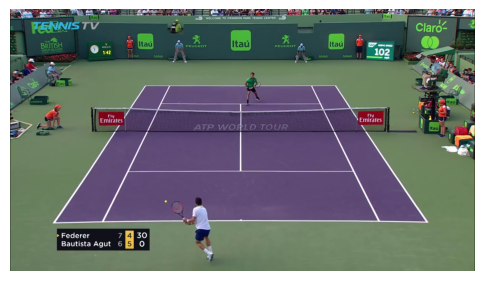

In [ ]:
import matplotlib.pyplot as plt
import cv2

img_path = "data/images/_vnC7WQazMM_2750.png"
img = cv2.imread(img_path)

plt.figure(figsize=(6,4))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

El **dataset de entrenamiento** está organizado de forma que cada imagen se identifica mediante un **ID único**, el cual corresponde directamente al nombre del archivo de imagen (por ejemplo, `PuXlxKdUIes_2450.png`). Toda la información asociada a estas imágenes se almacena en un único archivo **JSON**, que actúa como un gran diccionario (o lista de entradas) donde cada elemento describe completamente una muestra del conjunto de datos. En cada entrada del JSON se incluye, por un lado, el campo `id`, que permite localizar la imagen correspondiente, y por otro, una lista `kps` que contiene **14 pares de keypoints**, representando las coordenadas ((x, y)) de los puntos relevantes de la pista de tenis (intersecciones de líneas, esquinas y centros de servicio). Además, cada muestra incorpora un campo `metric`, que cuantifica el grado de desviación de esos keypoints con respecto a una representación ideal o de referencia de la pista; esta métrica se utiliza como indicador de la calidad o dificultad de la anotación y contribuye a que el modelo sea más robusto frente a variaciones de perspectiva, oclusiones y errores leves en la detección (una especie de data augmentation). [[1]](https://github.com/yastrebksv/TennisCourtDetector/tree/main)



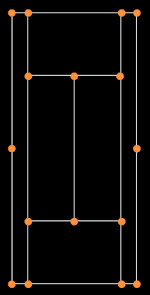


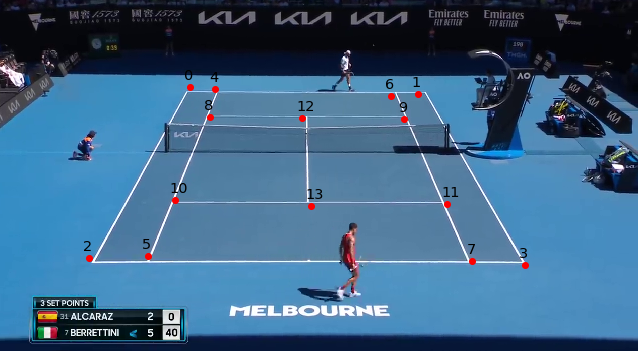

## **DATALOADER Y DATASET DE TORCH**


In [ ]:
import torch
from torchvision import models
import numpy as np
from torchvision.models import mobilenet_v3_small, MobileNet_V3_Small_Weights

import json
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

En el artículo “Improving tennis court line detection with machine learning”  [[2]](https://www.ml6.eu/en/blog/improving-tennis-court-line-detection-with-machine-learning), que sera el que usemos como guia para esta parte concreta, se propone un enfoque basado en CNN para la detección de líneas de pista de tenis, en el, despues de varios experimentos, se utiliza MobileNetV3-Small como arquitectura principal del modelo.

Esta red se elige por su excelente compromiso entre precisión y eficiencia computacional, lo que la hace especialmente adecuada para aplicaciones como esta en vídeo y en tiempo real. Siguiendo esta misma filosofía y para garantizar coherencia con el enfoque presentado en el artículo, en nuestro trabajo utilizamos igualmente MobileNetV3-Small preentrenada en ImageNet como backbone del modelo, aprovechando sus pesos ya entrenados y adaptándolos posteriormente mediante fine-tuning a la tarea específica de detección de keypoints de la pista.

In [ ]:
weights = MobileNet_V3_Small_Weights.IMAGENET1K_V1

Para entrenar el modelo primero definimos un **`Dataset`**, encargado de cargar y preprocesar las imágenes junto con sus *keypoints*. En primer lugar, las imágenes se convierten a **`PILImage`**, ya que muchas transformaciones de `torchvision` (como `Resize` o `Normalize`) están diseñadas para operar sobre este formato y garantizan un comportamiento consistente durante el preprocesado. Posteriormente, todas las imágenes se redimensionan a **480×480 píxeles**, que es la resolución de entrada recomendada en el artículo de referencia. La información de los *keypoints* se lee desde uno de los archivos **JSON**, donde para cada imagen se almacenan las coordenadas asociadas a los 14 puntos de la pista; estas coordenadas se ajustan proporcionalmente al nuevo tamaño de la imagen tras el redimensionado. Finalmente, las imágenes se normalizan utilizando la **media y desviación estándar de ImageNet**, ya que el backbone (MobileNetV3-Small) está preentrenado sobre este conjunto de datos, lo que permite que las distribuciones de entrada durante el entrenamiento sean coherentes con las del preentrenamiento.


El `Dataset` define las **funciones internas necesarias para que PyTorch pueda iterar correctamente durante el entrenamiento**. En el método `__getitem__`, se accede a una muestra concreta a partir de su índice `idx`: primero se obtiene el **ID de la imagen** desde el archivo JSON y, a partir de él, se carga la imagen correspondiente. A continuación, se recuperan sus dimensiones originales para poder **reescalar correctamente los keypoints**. La imagen se convierte de formato BGR a RGB y se le aplican las transformaciones definidas previamente. Por su parte, los keypoints se transforman en un **array de NumPy unidimensional de tipo `float32`**, lo que facilita su uso como vector de salida del modelo, y se reescalan proporcionalmente al nuevo tamaño de la imagen para mantener la coherencia geométrica. Finalmente, el método devuelve el par `(imagen, keypoints)` listo para el entrenamiento. El método `__len__` completa la implementación del `Dataset`, proporcionando el número total de muestras disponibles, información imprescindible para que el `DataLoader` pueda gestionar los *batches* y las épocas de entrenamiento.


In [ ]:
from torch.utils.data import Dataset
from torchvision import transforms
import json

class KeyPointsData(Dataset):
    def __init__(self, dir, data_file):
        self.dir = dir
        with open(data_file, "r") as f:
            self.data = json.load(f)

        self.transforms = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((480, 480)),
            transforms.ToTensor(),
            transforms.Normalize(
                mean=[0.485, 0.456, 0.406], #Nomralizacion en ImageNet
                std=[0.229, 0.224, 0.225]
            )
        ])

    def __getitem__(self, idx):
        sample = self.data[idx]
        img = cv2.imread(f"{self.dir}/{sample['id']}.png") #Sacar imagen
        h,w = img.shape[:2]


        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = self.transforms(img)

        keypoints = np.array(sample["kps"]).flatten()
        keypoints = keypoints.astype(np.float32) #Vector 1D de floats

        keypoints[::2] *= 480 / w #Ajustar al nuevo tamaño de imagen
        keypoints[1::2] *= 480 / h #Ajustar al nuevo tamaño de imagen

        return img, keypoints

    def __len__(self):
        return len(self.data)


dir = "data/images"
file = "data/data_train.json"
key = KeyPointsData(dir,file)

print(key.data)
print(f"Numero de imagenes:", len(key))

[{'id': 'PuXlxKdUIes_2450', 'metric': 0.28256459215943674, 'kps': [[378, 186], [905, 184], [242, 566], [1058, 564], [445, 185], [345, 566], [839, 185], [956, 564], [428, 247], [858, 246], [377, 445], [919, 443], [643, 247], [648, 444]]}, {'id': '3iQCaCGROsE_650', 'metric': 0.3278845387130213, 'kps': [[398, 167], [809, 167], [170, 528], [1044, 528], [450, 167], [280, 528], [758, 167], [935, 528], [429, 211], [780, 211], [346, 387], [866, 387], [604, 211], [606, 387]]}, {'id': 'rnr1EJDd6PA_300', 'metric': 0.3002555810557062, 'kps': [[392, 178], [888, 178], [160, 583], [1121, 585], [454, 178], [280, 583], [825, 178], [1000, 584], [430, 232], [849, 232], [344, 434], [935, 435], [639, 232], [639, 434]]}, {'id': '7qCfURaFMpQ_1350', 'metric': 0.2555257315173808, 'kps': [[398, 166], [875, 168], [184, 487], [1098, 485], [458, 166], [300, 487], [816, 167], [985, 485], [437, 210], [839, 211], [358, 370], [923, 370], [638, 210], [642, 370]]}, {'id': '5GFMhlMoqUs_150', 'metric': 0.3256935248378663,

Finalmente, instanciamos el **dataset de entrenamiento** proporcionando el directorio que contiene las imágenes y el archivo JSON con las anotaciones. Al crear el objeto `KeyPointsData`, se cargan automáticamente todas las entradas del archivo de anotaciones en memoria. Al imprimir `key.data`, podemos inspeccionar directamente el contenido del archivo JSON y comprobar la estructura de cada muestra. Asimismo, al llamar a `len(key)` verificamos el tamaño total del conjunto de datos de entrenamineto, confirmando que el dataset de entrenamiento está compuesto por **6630 imágenes**.




---


A continuación, se crean los **datasets de entrenamiento y validación** utilizando la clase `KeyPointsData`, cada uno asociado a su correspondiente archivo JSON. De esta forma, se garantiza una separación clara entre los datos empleados para el aprendizaje del modelo y aquellos utilizados para evaluar su rendimiento durante el entrenamiento. Posteriormente, estos datasets se encapsulan en **`DataLoader` de PyTorch**, que se encargan de suministrar los datos al modelo en forma de *mini-batches*. Se emplea un **batch size de 16**, tal y como se indica en el artículo de referencia, lo que proporciona un buen equilibrio entre estabilidad del gradiente y eficiencia computacional. Además, se activa la opción `shuffle=True` para ambos conjuntos, asegurando que las muestras se presenten en un orden aleatorio en cada época, lo que ayuda a reducir sesgos en el entrenamiento y mejora la capacidad de generalización del modelo.


In [ ]:
train_files = KeyPointsData(dir,"data/data_train.json")
val_files = KeyPointsData(dir,"data/data_val.json")

train_loader = DataLoader(train_files,batch_size=16,shuffle=True)
val_loader = DataLoader(val_files,batch_size=16,shuffle=True)

Una vez contamos con todos los datos podemos pasar a construir el modelo necesario para la tarea.

## **CARGA DEL MODELO**

Para el modelo utilizamos **MobileNetV3-Small**, la arquitectura mencionada anteriormente, cargando directamente sus **pesos preentrenados en ImageNet**. De este modo, el modelo parte de representaciones visuales ya aprendidas sobre un gran conjunto de datos genérico, lo que resulta especialmente beneficioso para acelerar el entrenamiento y mejorar la capacidad de generalización. Dado que la red original está diseñada para clasificación, es necesario **adaptar su cabecera (classifier)** a nuestro problema de regresión de keypoints. Para ello, se reemplaza la última capa totalmente conectada por una nueva capa lineal con **28 neuronas de salida**, correspondientes a **14 keypoints**, cada uno representado por sus coordenadas ((x, y)). Con esta modificación, el modelo deja de predecir clases y pasa a estimar directamente las posiciones de los puntos de la pista.

In [ ]:
weights = MobileNet_V3_Small_Weights.IMAGENET1K_V1
model = models.mobilenet_v3_small(weights=weights)

in_features = model.classifier[-1].in_features
model.classifier[-1] = torch.nn.Linear(in_features, 28) #14 kweypoints con x e y (14*2)
model = model.to(device)

Downloading: "https://download.pytorch.org/models/mobilenet_v3_small-047dcff4.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v3_small-047dcff4.pth


100%|██████████| 9.83M/9.83M [00:00<00:00, 220MB/s]


In [ ]:
from torchinfo import summary

summary(
    model,
    input_size=(1, 3, 480, 480),  # batch, channels, H, W
    device=str(device)
)


Layer (type:depth-idx)                             Output Shape              Param #
MobileNetV3                                        [1, 28]                   --
├─Sequential: 1-1                                  [1, 576, 15, 15]          --
│    └─Conv2dNormActivation: 2-1                   [1, 16, 240, 240]         --
│    │    └─Conv2d: 3-1                            [1, 16, 240, 240]         432
│    │    └─BatchNorm2d: 3-2                       [1, 16, 240, 240]         32
│    │    └─Hardswish: 3-3                         [1, 16, 240, 240]         --
│    └─InvertedResidual: 2-2                       [1, 16, 120, 120]         --
│    │    └─Sequential: 3-4                        [1, 16, 120, 120]         744
│    └─InvertedResidual: 2-3                       [1, 24, 60, 60]           --
│    │    └─Sequential: 3-5                        [1, 24, 60, 60]           3,864
│    └─InvertedResidual: 2-4                       [1, 24, 60, 60]           --
│    │    └─Sequential: 3-6   

A partir del *summary* se puede observar que **no es una red especialmente grande ni profunda**. El modelo completo cuenta con aproximadamente **1,55 millones de parámetros**, una cifra reducida en comparación con arquitecturas más pesadas como ResNet, manteniendo aun así una capacidad representativa suficiente gracias al uso de **bloques Inverted Residual**, convoluciones separables y activaciones *Hardswish*. Además, el resumen muestra claramente que la **última capa del clasificador ha sido adaptada correctamente**: la red finaliza con una capa totalmente conectada de **28 neuronas**, que corresponde exactamente a la predicción de **14 keypoints con dos coordenadas ((x, y)) cada uno**.


## **ENTRENAMIENTO DEL MODELO**


En la mayoría de los artículos relacionados con detección de líneas o keypoints de pista se opta por **entrenar el modelo completo desde cero**, partiendo de pesos inicializados aleatoriamente. Sin embargo, tras realizar **múltiples experimentos y distintos esquemas de entrenamiento**, observamos que este enfoque no era el más eficiente ni el que ofrecía mejores resultados en nuestro caso. En su lugar, concluimos que la estrategia más adecuada era aplicar **fine-tuning**, tal y como se planteó en la práctica 2. Este procedimiento consiste en partir de un modelo **preentrenado en ImageNet**, y realizar inicialmente un entrenamiento corto de **solo la cabecera del modelo**, manteniendo congelado el resto de la red para adaptar de forma estable las capas finales a la tarea específica de regresión de keypoints. Posteriormente, una vez la cabecera ha convergido, se **descongelan progresivamente las capas del backbone** y se dedica la mayor parte del presupuesto de entrenamiento a refinar todo el modelo de manera conjunta. Este enfoque permitió obtener una convergencia más estable, reducir el riesgo de sobreajuste y aprovechar de forma más efectiva el conocimiento previo del modelo, logrando un mejor equilibrio entre precisión y coste computacional.



### **ENTRENAMIENTO DE LA CABECERA**

Para el entrenamiento se definió como función de pérdida el **MAE (Mean Absolute Error)**, implementado mediante `torch.nn.L1Loss`, ya que este criterio resulta especialmente adecuado para este problema y es el mismo que se emplea en el artículo de referencia. A diferencia de otras funciones de pérdida como MSE, el MAE es menos sensible a valores atípicos, lo que aporta mayor robustez cuando existen pequeñas imprecisiones en la anotación de los puntos. En esta fase inicial de *fine-tuning*, se **congelan los parámetros del backbone (`model.features`)** y se entrenan únicamente los de la **cabecera (`model.classifier`)**, utilizando el optimizador **Adam** con una tasa de aprendizaje de $1 \times 10^{-3}$.

Tras experimentar con distintos criterios de pérdida y optimizadores, la tupla **MAE + Adam** fue el que proporcionó una convergencia más estable y mejores resultados empíricos. El entrenamiento de la cabecera se realiza durante un número reducido de épocas (5), ya que mas epocas no daban ninguna mejora, monitorizando la pérdida a lo largo de los *steps* para asegurar que el modelo comienza a adaptarse correctamente a la tarea antes de proceder a la fase de entrenamiento completo.


In [ ]:
criterion = torch.nn.L1Loss()  # MAE

for param in model.features.parameters():
    param.requires_grad = False

for param in model.classifier.parameters():
    param.requires_grad = True

optimizer = torch.optim.Adam(
    model.classifier.parameters(),
    lr=1e-3
)

epochs_head = 5
print_every = 20

for epoch in range(epochs_head):
    model.train()
    running_loss = 0.0

    for i, (images, keypoints) in enumerate(train_loader):
        images = images.to(device)
        keypoints = keypoints.to(device)

        preds = model(images)
        loss = criterion(preds, keypoints)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

        if i % print_every == 0:
            print(
                f"[HEAD] Epoch {epoch+1}/{epochs_head} "
                f"Step {i}/{len(train_loader)} "
                f"Loss: {loss.item():.4f}"
            )

    print(
        f"[HEAD] Epoch {epoch+1} DONE "
        f"- Avg Loss: {running_loss/len(train_loader):.4f}"
    )


[HEAD] Epoch 1/5 Step 0/415 Loss: 13.1688
[HEAD] Epoch 1/5 Step 20/415 Loss: 18.1659
[HEAD] Epoch 1/5 Step 40/415 Loss: 13.3912
[HEAD] Epoch 1/5 Step 60/415 Loss: 18.2567
[HEAD] Epoch 1/5 Step 80/415 Loss: 13.1089
[HEAD] Epoch 1/5 Step 100/415 Loss: 15.0258
[HEAD] Epoch 1/5 Step 120/415 Loss: 13.4272
[HEAD] Epoch 1/5 Step 140/415 Loss: 14.7749
[HEAD] Epoch 1/5 Step 160/415 Loss: 21.7389
[HEAD] Epoch 1/5 Step 180/415 Loss: 14.2693
[HEAD] Epoch 1/5 Step 200/415 Loss: 12.8301
[HEAD] Epoch 1/5 Step 220/415 Loss: 12.0907
[HEAD] Epoch 1/5 Step 240/415 Loss: 15.5936
[HEAD] Epoch 1/5 Step 260/415 Loss: 12.3131
[HEAD] Epoch 1/5 Step 280/415 Loss: 9.7257
[HEAD] Epoch 1/5 Step 300/415 Loss: 12.3516
[HEAD] Epoch 1/5 Step 320/415 Loss: 11.8069
[HEAD] Epoch 1/5 Step 340/415 Loss: 11.3462
[HEAD] Epoch 1/5 Step 360/415 Loss: 12.9758
[HEAD] Epoch 1/5 Step 380/415 Loss: 10.6675
[HEAD] Epoch 1/5 Step 400/415 Loss: 13.9367
[HEAD] Epoch 1 DONE - Avg Loss: 13.7688
[HEAD] Epoch 2/5 Step 0/415 Loss: 13.7624
[

Como se observa en los resultados del entrenamiento de la cabecera, el modelo parte ya de un **error medio relativamente bajo**, alrededor de **13 píxeles**, lo cual es coherente con el hecho de utilizar una red **preentrenada en ImageNet** y no un modelo inicializado desde cero. A lo largo de las cinco épocas de *fine-tuning* de la cabecera, la pérdida MAE desciende de forma progresiva y estable hasta situarse en torno a **10 píxeles de error medio**, lo que indica que el modelo se adapta a la tarea específica de regresión de keypoints. Este valor resulta **razonable**, especialmente teniendo en cuenta la complejidad del problema y la variabilidad de las perspectivas en las imágenes, ya que implica un error aproximado de solo **10 píxeles por keypoint** sobre imágenes de 480×480. Estos resultados confirman que la estrategia de entrenar primero únicamente la cabecera es efectiva y proporciona una base sólida antes de proceder al entrenamiento completo del modelo.


### **ENTRENAMIENTO DE TODA LA RED**

En la segunda fase del entrenamiento se **descongelan todos los parámetros del modelo**, permitiendo que tanto el *backbone* como la cabecera se optimicen de forma conjunta. De este modo, la red puede refinar las representaciones aprendidas inicialmente y adaptarlas con mayor precisión a la tarea de detección de keypoints. Para garantizar una **mayor estabilidad en las últimas etapas del entrenamiento**, se introduce un *learning rate scheduler* de tipo **StepLR**, que reduce la tasa de aprendizaje cada cierto número de épocas (en este caso, cada 15 épocas con un factor de 0.1). Esta estrategia ayuda a evitar oscilaciones y facilita una convergencia más suave a medida que el modelo se acerca a un mínimo. Tras varios experimentos, se observó que entrenar durante **más de 20 épocas completas no aportaba mejoras significativas en la convergencia**, por lo que se decidió limitar el entrenamiento a este número, logrando un equilibrio adecuado entre rendimiento final y coste computacional.

In [ ]:
for param in model.parameters():
    param.requires_grad = True

scheduler = torch.optim.lr_scheduler.StepLR(
    optimizer,
    step_size=15,   # epochs
    gamma=0.1
)

epochs_full = 20

for epoch in range(epochs_full):
    model.train()
    running_loss = 0.0

    for images, keypoints in train_loader:
        images = images.to(device)
        keypoints = keypoints.to(device)

        preds = model(images)
        loss = criterion(preds, keypoints)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    scheduler.step()

    print(
        f"[FULL] Epoch {epoch+1}/{epochs_full} "
        f"- Loss: {running_loss/len(train_loader):.4f} "
        f"- LR: {scheduler.get_last_lr()[0]:.2e}"
    )


[FULL] Epoch 1/20 - Loss: 10.1178 - LR: 1.00e-03
[FULL] Epoch 2/20 - Loss: 9.8583 - LR: 1.00e-03
[FULL] Epoch 3/20 - Loss: 9.7181 - LR: 1.00e-03
[FULL] Epoch 4/20 - Loss: 9.6051 - LR: 1.00e-03
[FULL] Epoch 5/20 - Loss: 9.4848 - LR: 1.00e-03
[FULL] Epoch 6/20 - Loss: 9.3231 - LR: 1.00e-03
[FULL] Epoch 7/20 - Loss: 9.1213 - LR: 1.00e-03
[FULL] Epoch 8/20 - Loss: 9.0727 - LR: 1.00e-03
[FULL] Epoch 9/20 - Loss: 9.0588 - LR: 1.00e-03
[FULL] Epoch 10/20 - Loss: 8.8708 - LR: 1.00e-03
[FULL] Epoch 11/20 - Loss: 8.7618 - LR: 1.00e-03
[FULL] Epoch 12/20 - Loss: 8.8300 - LR: 1.00e-03
[FULL] Epoch 13/20 - Loss: 8.6832 - LR: 1.00e-03
[FULL] Epoch 14/20 - Loss: 8.5737 - LR: 1.00e-03
[FULL] Epoch 15/20 - Loss: 8.6229 - LR: 1.00e-04
[FULL] Epoch 16/20 - Loss: 7.8203 - LR: 1.00e-04
[FULL] Epoch 17/20 - Loss: 7.7915 - LR: 1.00e-04
[FULL] Epoch 18/20 - Loss: 7.6646 - LR: 1.00e-04
[FULL] Epoch 19/20 - Loss: 7.5747 - LR: 1.00e-04
[FULL] Epoch 20/20 - Loss: 7.6267 - LR: 1.00e-04


Como muestran los resultados del entrenamiento completo, el error medio continúa reduciéndose de forma progresiva hasta situarse en torno a **7–8 píxeles** tras las 20 épocas, especialmente después de la reducción de la tasa de aprendizaje introducida por el *scheduler*. Aunque el error no desaparece por completo, esto **no supone un problema crítico para nuestro objetivo**, ya que el propósito principal de la CNN no es obtener una localización perfecta de los keypoints, sino proporcionar una **estimación inicial fiable** de su posición. A partir de esta predicción, se aplican posteriormente **técnicas clásicas de visión por computador** (como detección de líneas, intersecciones y refinamiento geométrico) que permiten **ajustar y corregir con mayor precisión la posición final de los keypoints**. De este modo, la red neuronal actúa como un primer paso robusto que simplifica el problema y reduce el espacio de búsqueda, mientras que los métodos geométricos posteriores se encargan de afinar el resultado final, combinando así las ventajas del aprendizaje profundo y de la visión por computador tradicional.


### **GUARDADO DEL MODELO**

Esta parte es solo el entrenamiento ahora guardamos el modelo tanto en local o en drive para no tener que repetir este procedimiento cada vez, que lleva un largo tiempo.

In [ ]:
torch.save(model.state_dict(), "model_final.pth")
print("Modelo guardado en local (/content)")

Modelo guardado en local (/content)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

drive_path = "/content/drive/MyDrive/model_court.pth"
torch.save(model.state_dict(), drive_path)
print("Modelo guardado en Google Drive")


Mounted at /content/drive
Modelo guardado en Google Drive


Creamos la clase **`CourtLineDetector`** como un módulo dedicado exclusivamente a la **fase de inferencia**, con el objetivo de reutilizar el modelo entrenado en cualquier parte del proyecto. En su inicialización se reconstruye exactamente la **misma arquitectura empleada durante el entrenamiento**, basada en **MobileNetV3 Small**, y se adapta su última capa totalmente conectada para producir **28 salidas**. A continuación, se cargan los pesos aprendidos desde el archivo proporcionado y se define el mismo preprocesado de imágenes (redimensionado a 480×480 y normalización ImageNet), garantizando coherencia total entre entrenamiento e inferencia.

El método principal de la clase, **`predict`**, recibe una imagen en formato OpenCV (BGR), la transforma al espacio adecuado y ejecuta la inferencia sin cálculo de gradientes. Los keypoints obtenidos inicialmente están expresados en el sistema de referencia 480×480 del modelo, por lo que se **reescala automáticamente el resultado al tamaño original de la imagen**, devolviendo directamente coordenadas en píxeles reales. Esto permite que los keypoints puedan usarse de forma inmediata en etapas posteriores. Por último, la clase incluye **métodos auxiliares de visualización** pensados para depuración y análisis.


In [ ]:
import torch
import cv2
import numpy as np
from torchvision import models, transforms
from torchvision.models import MobileNet_V3_Small_Weights


class CourtLineDetector:
    def __init__(self, model_path, device=None):
        self.device = device or torch.device("cuda" if torch.cuda.is_available() else "cpu")
        weights = MobileNet_V3_Small_Weights.IMAGENET1K_V1
        self.model = models.mobilenet_v3_small(weights=weights)
        in_features = self.model.classifier[-1].in_features
        self.model.classifier[-1] = torch.nn.Linear(in_features, 28)
        state_dict = torch.load(model_path, map_location=self.device)
        self.model.load_state_dict(state_dict)

        self.model.to(self.device)
        self.model.eval()

        self.transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((480, 480)),
            transforms.ToTensor(),
            transforms.Normalize(
                mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]
            )
        ])

    def predict(self, image_bgr):
        """
        image_bgr: imagen OpenCV (H,W,3) en BGR
        devuelve keypoints en píxeles originales
        """
        h, w = image_bgr.shape[:2]

        image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
        image_tensor = self.transform(image_rgb).unsqueeze(0).to(self.device)

        with torch.no_grad():
            outputs = self.model(image_tensor)

        keypoints_480 = outputs.squeeze().cpu().numpy()

        keypoints = keypoints_480.copy()
        keypoints[0::2] *= w / 480.0
        keypoints[1::2] *= h / 480.0

        return keypoints

    def draw_keypoints(self, image, keypoints):
        """
        Dibuja los keypoints sobre la imagen
        """
        for i in range(0, len(keypoints), 2):
            x = int(keypoints[i])
            y = int(keypoints[i + 1])

            cv2.circle(image, (x, y), 5, (0, 0, 255), -1)
            cv2.putText(
                image,
                str(i // 2),
                (x + 5, y - 5),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.5,
                (0, 0, 255),
                1,
                cv2.LINE_AA
            )

        return image

    def draw_keypoints_on_video(self, video_frames, keypoints):
        """
        Aplica los keypoints a una lista de frames
        """
        output_frames = []
        for frame in video_frames:
            frame = self.draw_keypoints(frame.copy(), keypoints)
            output_frames.append(frame)
        return output_frames


### **VALIDACIÓN DEL MODELO APLICADO A FRAMES**

Ahora que todo el **pipeline completo** está implementado, realizamos una **prueba de inferencia sobre una imagen no vista durante el entrenamiento**, para evaluar la capacidad de generalización del modelo. Se carga el modelo final entrenado (`model_final.pth` en local) mediante la clase `CourtLineDetector`, y se lee la imagen de prueba.

A continuación, se ejecuta el método `predict`, que devuelve los **14 keypoints reescalados al sistema de coordenadas original de la imagen**. Esta prueba demuestra que el modelo no solo ha aprendido a localizar correctamente las líneas de la pista en el conjunto de entrenamiento, sino que además **generaliza correctamente a imágenes nuevas**, validando la robustez del enfoque y dejando el sistema listo para integrarse en etapas posteriores como el cálculo de homografías, el seguimiento de jugadores o la proyección sobre la pista plana.


720 1280
[ 394.8619   187.65852  882.05115  187.64438  215.12442  558.8092
 1063.5408   559.8039   455.62152  187.60146  321.12518  559.22424
  820.9074   187.7371   957.026    559.1277   435.4742   241.8003
  841.47253  241.72766  368.218    430.83014  909.6791   431.03326
  637.65533  241.76715  638.409    430.8587 ]


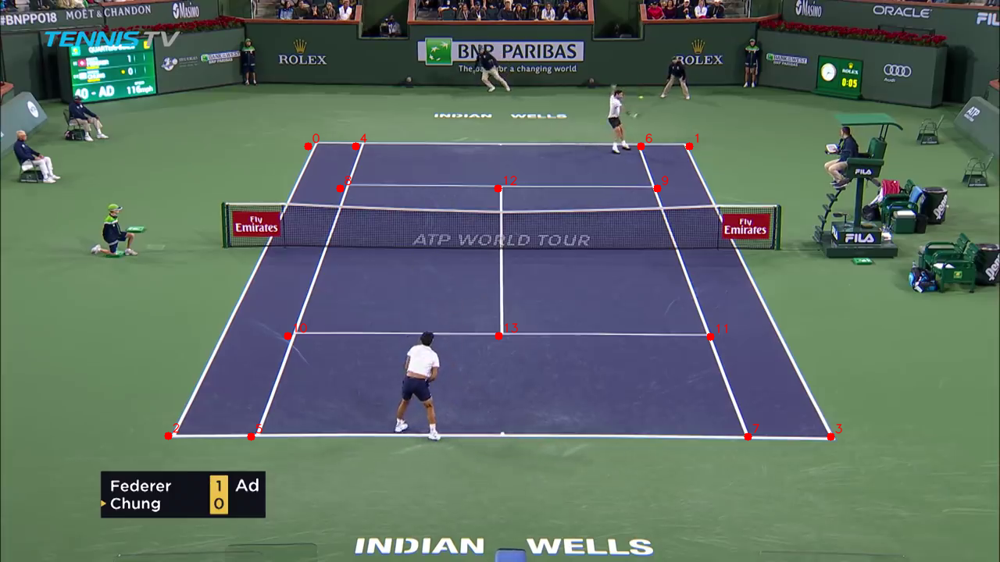

-1

In [ ]:
from google.colab.patches import cv2_imshow
detector = CourtLineDetector("model_final.pth")

frame = cv2.imread("data/images/_NJJtDrb928_50.png")
h,w = frame.shape[:2]
print(h,w)
frame_480 = cv2.resize(frame, (480, 480))
keypoints = detector.predict(frame)
print(keypoints)
out = detector.draw_keypoints(frame.copy(), keypoints)
cv2_imshow(out)
cv2.waitKey(0)

Durante esta fase de validación cualitativa observamos que el modelo es **bastante susceptible a cambios fuertes de orientación de la cámara**, especialmente cuando se prueba con imágenes procedentes de otros *datasets*. Este comportamiento es coherente con el conjunto de entrenamiento, ya que **la gran mayoría de las imágenes presentan una perspectiva muy similar**, típica de retransmisiones de tenis con cámara fija y elevada. En este contexto, el modelo aprende muy bien la geometría de la pista bajo esa configuración concreta, pero le cuesta generalizar a rotaciones o ángulos de vista poco frecuentes.

Probamos a introducir **data augmentation** más agresiva (rotaciones, flips, cambios de perspectiva), pero los resultados **empeoraron de forma notable**, ya que muchas de estas transformaciones generan pistas físicamente poco realistas o inconsistentes con la geometría real del tenis. Esto acababa confundiendo a la red y degradando la precisión de los keypoints, especialmente en líneas críticas como la central o las de saque.

Por este motivo, asumimos explícitamente la **limitación del modelo frente a ciertas orientaciones de cámara**, aceptando este compromiso como razonable para el dominio objetivo del problema. Aun así, el modelo se muestra **robusto frente a traslaciones, escalados moderados y variaciones de encuadre**, que son precisamente los cambios más habituales en secuencias reales de partidos, lo que lo hace plenamente válido para el resto del pipeline desarrollado.



## **POSTPROCESADO Y REFINAMIENTO DE KEYPOINTS**

Si bien el modelo es capaz de predecir **keypoints coherentes y estables**, en muchos casos estos **no caen exactamente sobre las esquinas o intersecciones reales de las líneas**, que es donde resulta crítico que estén ubicados para los procedimientos posteriores (cálculo de homografías, proyección a la pista plana, etc.). Por este motivo, no utilizamos directamente la salida de la red como resultado final, sino que la tratamos como una **estimación inicial de la posición de cada keypoint**. A partir de esta estimación, aplicamos un **postprocesado basado en técnicas clásicas de visión por computador** que nos permite ajustar con mayor precisión la localización final, mejorando así la robustez y exactitud del sistema completo.


In [ ]:
import numpy as np

pairs = np.array(keypoints).reshape(-1, 2)
print(pairs)

[[ 394.8619   187.65852]
 [ 882.05115  187.64438]
 [ 215.12442  558.8092 ]
 [1063.5408   559.8039 ]
 [ 455.62152  187.60146]
 [ 321.12518  559.22424]
 [ 820.9074   187.7371 ]
 [ 957.026    559.1277 ]
 [ 435.4742   241.8003 ]
 [ 841.47253  241.72766]
 [ 368.218    430.83014]
 [ 909.6791   431.03326]
 [ 637.65533  241.76715]
 [ 638.409    430.8587 ]]


Lo primero que hacemos es **reorganizar la salida del modelo**, que originalmente es un vector 1D de tamaño 28 (correspondiente a 14 keypoints con coordenadas $x, y$), en una representación más natural y manejable. Para ello, convertimos este vector plano en un array de **pares 2D**, donde cada fila representa explícitamente un keypoint en el plano de la imagen. De este modo, pasamos de una estructura $[x_1, y_1, x_2, y_2, \dots]$ a una forma $(14, 2)$ , lo que facilita enormemente las operaciones geométricas posteriores, como cálculos de distancias, búsqueda de líneas cercanas o refinamiento de intersecciones.


---

### **CROPPING**

El primer paso del preprocesado consiste en construir un recorte cuadrado (crop) alrededor de cada keypoint estimado por la red. La idea es utilizar el keypoint predicho por la CNN únicamente como una aproximación inicial de la posición, y centrarnos después en una región local mucho más pequeña de la imagen original. Este crop se extrae centrado en el keypoint y con un tamaño fijo, de forma que siempre contenga el entorno inmediato de la posible esquina real.

Trabajar sobre estos recortes tiene varias ventajas importantes: reduce drásticamente el ruido visual, limita la búsqueda a una zona relevante y permite aplicar algoritmos clásicos de visión por computador (detección de bordes, líneas, intersecciones, etc.) de manera mucho más robusta y eficiente. De este modo, el modelo de deep learning actúa como un localizador grueso, mientras que el procesamiento posterior en cada crop se encarga de afinar la posición exacta de la esquina real, que es crítica para los pasos posteriores del pipeline.




In [ ]:
def crop_square(image, center_x, center_y, size):
    """
    Recorta un cuadrado de la imagen.

    Args:
        image: imagen BGR (H, W, C)
        center_x, center_y: centro del recorte
        size: lado del cuadrado (en píxeles)

    Returns:
        Imagen recortada (size x size x C)
    """
    h, w = image.shape[:2]
    half = size // 2

    x1 = max(center_x - half, 0)
    y1 = max(center_y - half, 0)
    x2 = min(center_x + half, w)
    y2 = min(center_y + half, h)

    crop = image[y1:y2, x1:x2].copy()
    return crop

El **tamaño del crop (`crop_size`) es un parámetro crítico** en este proceso de refinamiento de keypoints. Si el recorte es **demasiado pequeño**, existe un alto riesgo de que la esquina real no quede completamente contenida dentro del crop, especialmente cuando la predicción inicial del modelo presenta un pequeño error. En ese caso, los algoritmos clásicos aplicados posteriormente (detección de bordes, líneas o intersecciones) no disponen de la información necesaria y pueden fallar o devolver resultados inestables.

Por el contrario, si el **crop es demasiado grande**, el problema se invierte: aparecen múltiples líneas y posibles intersecciones que no corresponden a la esquina deseada. Esto puede provocar que el algoritmo de refinamiento seleccione una esquina incorrecta, desplazando el keypoint final más de lo debido respecto a su posición real. Por este motivo, el tamaño del crop debe elegirse como un **compromiso entre contexto suficiente y ambigüedad mínima**, de forma que incluya la esquina correcta pero limite al máximo la presencia de estructuras irrelevantes.


De manera puramente empirica los tamaños que mejores resultados nos han aportado son entre **80-120** pixeles. Siendo los mejores 100 y 110 pixeles.

In [ ]:
crops = []
crop_centers = []
crop_size = 100  # píxeles

for i, (x, y) in enumerate(pairs):
    cx = int(round(x))
    cy = int(round(y))

    crop = crop_square(frame, cx, cy, crop_size)
    crops.append(crop)
    crop_centers.append((cx, cy))

    print(f"Keypoint {i}: center=({cx}, {cy}), crop shape={crop.shape}")


Keypoint 0: center=(400, 172), crop shape=(100, 100, 3)
Keypoint 1: center=(845, 171), crop shape=(100, 100, 3)
Keypoint 2: center=(196, 533), crop shape=(100, 100, 3)
Keypoint 3: center=(1047, 533), crop shape=(100, 100, 3)
Keypoint 4: center=(456, 172), crop shape=(100, 100, 3)
Keypoint 5: center=(304, 534), crop shape=(100, 100, 3)
Keypoint 6: center=(790, 172), crop shape=(100, 100, 3)
Keypoint 7: center=(943, 533), crop shape=(100, 100, 3)
Keypoint 8: center=(435, 220), crop shape=(100, 100, 3)
Keypoint 9: center=(811, 220), crop shape=(100, 100, 3)
Keypoint 10: center=(360, 401), crop shape=(100, 100, 3)
Keypoint 11: center=(887, 401), crop shape=(100, 100, 3)
Keypoint 12: center=(624, 220), crop shape=(100, 100, 3)
Keypoint 13: center=(625, 401), crop shape=(100, 100, 3)


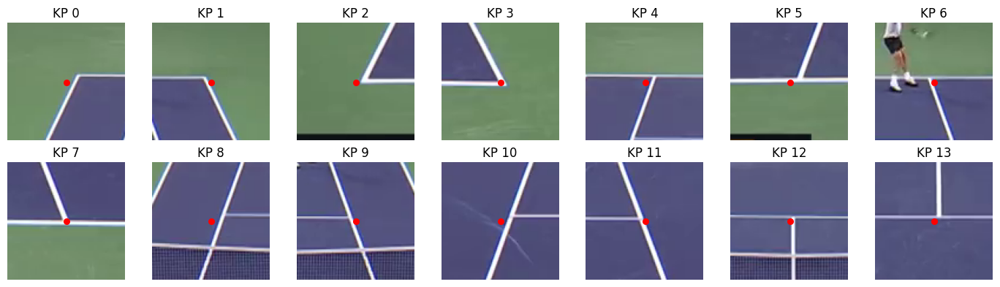

In [ ]:
import matplotlib.pyplot as plt
import cv2

plt.figure(figsize=(14, 4))

for i, crop in enumerate(crops):
    plt.subplot(2, 7, i + 1)

    # BGR → RGB
    crop_rgb = cv2.cvtColor(crop, cv2.COLOR_BGR2RGB)
    plt.imshow(crop_rgb)

    h, w = crop.shape[:2]
    cx, cy = w // 2, h // 2
    plt.scatter(cx, cy, c="red", s=30)

    plt.title(f"KP {i}")
    plt.axis("off")

plt.tight_layout()
plt.show()


En esta imagen se aprecia con mayor claridad el comportamiento del modelo: aunque **la mayoría de keypoints caen cerca de las líneas correctas**, varios de ellos aparecen **ligeramente desplazados respecto a la intersección exacta de las líneas**, que es donde idealmente deberían situarse. Este efecto es especialmente visible en esquinas donde la perspectiva es más extrema o donde confluyen varias líneas con ángulos similares, lo que introduce ambigüedad para la red neuronal.


### **ZHANG-SUEN THINNING ALGORITHM**

El siguiente paso del postprocesado consiste en **unificar el grosor de todas las líneas y eliminar el ruido innecesario**, ya que para detectar intersecciones de forma fiable es fundamental trabajar con líneas limpias y, a ser posible, de **un solo píxel de ancho**. Durante esta fase se probaron distintos enfoques clásicos de visión por computador, como umbralización en el espacio HSV, detección de bordes con Canny y combinaciones de ambos. Sin embargo, estos métodos resultaron sensibles al ruido, a variaciones de iluminación y a la distancia de la cámara, produciendo líneas discontinuas o con grosores irregulares.

El método que ofreció los mejores resultados fue el **Zhang-Suen Thinning Algorithm**, un algoritmo de esqueletización diseñado específicamente para **reducir imágenes binarias a un esqueleto de un píxel de grosor** manteniendo la estructura geométrica original. Este algoritmo **elimina píxeles de forma iterativa** bajo una serie de condiciones topológicas, lo que permite **conservar la conectividad de las líneas mientras se descarta ruido y redundancia**. Gracias a este proceso, las líneas de la pista quedan bien definidas, homogéneas y mucho más adecuadas para etapas posteriores como la detección de líneas con Hough y el cálculo preciso de intersecciones.


Como hemos dicho algoritmo trabaja sobre una imagen binaria normalizada a valores 0 y 1 y se ejecuta de forma iterativa, **eliminando píxeles de borde** en múltiples pasadas hasta que no se producen más cambios. La idea principal es: en cada iteración, se analizan los píxeles interiores de la imagen y **se evalúa si un píxel puede eliminarse sin romper la conectividad de la línea a la que pertenece**. Para ello, se examina el vecindario de 8 píxeles alrededor del píxel central y se aplican una serie de condiciones geométricas.

Las condiciones principales controlan **tres aspectos clave**: el **número de vecinos activos** (para evitar eliminar píxeles aislados o romper líneas), el **número de transiciones de fondo a primer plano alrededor del píxel** (para asegurar que el píxel pertenece a una única estructura conectada) y un **conjunto de restricciones adicionales** que dependen de la sub-iteración actual. Estas sub-iteraciones permiten **eliminar píxeles de forma progresiva** desde diferentes direcciones, garantizando que el adelgazamiento sea simétrico y estable.

De esta forma obtenemos una **imagen binaria con las lineas de las esquinas formadas por solo un píxel**, facilitando la identificación correcta de las lineas con Hough Lines.

In [ ]:
def zhang_suen_thinning(binary):
    img = binary.copy() // 255
    changed = True

    while changed:
        changed = False
        to_remove = []

        rows, cols = img.shape
        for step in [0, 1]:
            to_remove.clear()

            for i in range(1, rows - 1):
                for j in range(1, cols - 1):
                    P = [
                        img[i, j],
                        img[i-1, j], img[i-1, j+1], img[i, j+1], img[i+1, j+1],
                        img[i+1, j], img[i+1, j-1], img[i, j-1], img[i-1, j-1]
                    ]

                    if P[0] != 1:
                        continue

                    neighbors = sum(P[1:])
                    if neighbors < 2 or neighbors > 6:
                        continue

                    transitions = sum(
                        (P[k] == 0 and P[k+1] == 1)
                        for k in range(1, 8)
                    ) + (P[8] == 0 and P[1] == 1)

                    if transitions != 1:
                        continue

                    if step == 0:
                        if P[1] * P[3] * P[5] != 0:
                            continue
                        if P[3] * P[5] * P[7] != 0:
                            continue
                    else:
                        if P[1] * P[3] * P[7] != 0:
                            continue
                        if P[1] * P[5] * P[7] != 0:
                            continue

                    to_remove.append((i, j))

            for i, j in to_remove:
                img[i, j] = 0
                changed = True

    return (img * 255).astype(np.uint8)


Para visualizar el funcionamiento de este algoritmo lo aplicamos sobre unos cuantos keypoints de ejemplo.

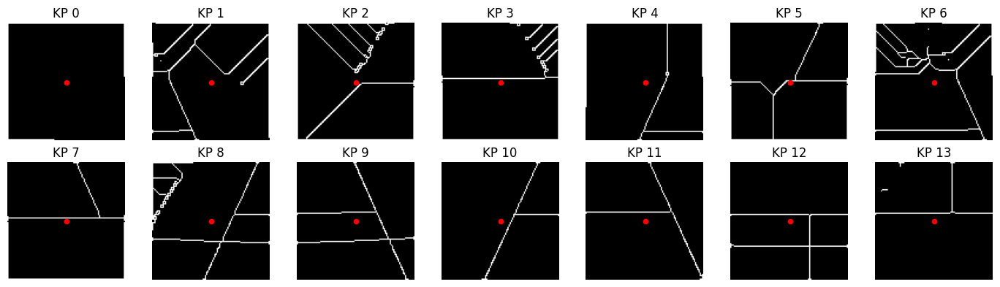

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(14, 4))

for i, crop in enumerate(crops):
    plt.subplot(2, 7, i + 1)

    # 1. BGR → Gray
    gray = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)

    # 2. Binarización (ajusta si hace falta)
    _, binary = cv2.threshold(
        gray, 0, 255,
        cv2.THRESH_BINARY + cv2.THRESH_OTSU
    )

    # 3. Zhang-Suen thinning
    thin = zhang_suen_thinning(binary)

    # 4. Mostrar
    plt.imshow(thin, cmap="gray")

    h, w = thin.shape
    cx, cy = w // 2, h // 2
    plt.scatter(cx, cy, c="red", s=20)

    plt.title(f"KP {i}")
    plt.axis("off")

plt.tight_layout()
plt.show()

Si nos fijamos vemos como efectivamente **reduce todas las lineas a un píxel de grosor**, aunque tiene **varios fallos** que nos complican la detección de las esquinas de la pista.

Para empezar observamos como hay algunas lineas que **no detectamos**, como podrian ser las del **keypoint 0**, que corresponde a la esquina izquierda mas alejada.

Esto se debe a que este algoritmo **no realiza segmentación ni discriminación semántica**, sino únicamente un refinado morfológico de las estructuras presentes en la imagen. Cuando se aplica directamente sobre una binarización simple, **tanto las líneas de la pista como elementos del fondo con contraste similar** (sombras, texturas del suelo, marcas secundarias o ruido estructural) **son adelgazados por igual**, generando múltiples **líneas espurias**.

Además, la **perspectiva de la cámara** provoca una **gran variación en el grosor** aparente de las líneas: las **más lejanas resultan muy finas o discontinuas** y tienden a **desaparecer durante el proceso de adelgazamiento**, mientras que las más cercanas se conservan. Sin un refuerzo previo de estas líneas débiles, Zhang–Suen **elimina información geométrica** relevante para la detección posterior.

Es por ello que concluimos que necesitaremos concatenar unas cuantas transformaciones para detectar correctamente las líneas.

### **TRANSFORMACIONES PREVIAS A HOUGH LINES**

Como hemos comentado anteriormente, para conseguir **detectar correctamente las líneas** tenemos que preprocesar correctamente los crops de las imagenes correspondientes a cada keypoint detectado para así poder **calcular la posición exacta de las esquinas**. Para ello creamos una función que realice todo el procesamiento.



---


En primer lugar, se aplica una **reducción de colores mediante K-Means**, **agrupando los píxeles de la imagen en un número reducido de clústeres de color**. Esta etapa permite simplificar la escena y reducir la influencia de texturas complejas, publicidad o variaciones de color en el fondo, **manteniendo principalmente los colores dominantes de la pista y las líneas blancas**, que es lo que nos interesa.

A continuación, la imagen reducida se convierte a escala de grises y **se binariza mediante un umbral fijo**. Con este paso **se eliminan los colores dominantes del fondo y se realzan las líneas claras de la pista**, obteniendo una imagen binaria donde las líneas aparecen destacadas frente al resto de la escena.

En la tercera etapa se aplica una **dilatación morfológica adaptativa**, cuyo tamaño de kernel depende de la resolución de la imagen. Esta operación **engrosa las líneas detectadas**, especialmente las que aparecen **más alejadas de la cámara** y que, debido a la perspectiva, pueden resultar demasiado finas o fragmentadas. De este modo se mejora la continuidad de las líneas antes de aplicar procesos posteriores. Esto lo añadimos porque **muchas veces no detectábamos las líneas del fondo**, ya que debido a la perspectiva acababan **casi desapareciendo al aplicar transformaciones**. Aunque parezca un poco contraintuitivo primero engrosarlas para después afinarlas, este proceso nos ha dado una mayor estabilidad en los resultados obtenidos.

Finalmente, se utiliza el algoritmo de adelgazamiento de **Zhang–Suen** para **reducir nuevamente las líneas a un único píxel de grosor**, preservando su estructura y conectividad.

Esta **combinación de engrosado y posterior adelgazado permite obtener líneas continuas, limpias y bien definidas**, optimizadas para la detección precisa de segmentos rectos mediante la transformada de Hough.

El resultado de esta función es una **imagen binaria con las líneas de la pista claramente definidas** y estructuralmente estables, adecuada para la detección fiable de líneas y esquinas en etapas posteriores del sistema.

In [ ]:
def preprocess_for_hough(image):
    # se reducen los colores
    Z = image.reshape((-1, 3))
    Z = np.float32(Z)

    _, labels, centers = cv2.kmeans(
        Z, 4, None,
        (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0),
        10, cv2.KMEANS_RANDOM_CENTERS
    )

    centers = np.uint8(centers)
    reduced = centers[labels.flatten()].reshape(image.shape)

    # se eliminan los colores dominantes (fondo)
    gray = cv2.cvtColor(reduced, cv2.COLOR_BGR2GRAY)
    _, binary = cv2.threshold(gray, 170, 255, cv2.THRESH_BINARY)

    # se engruesan las lineas con dilatación adaptativa
    h, w = binary.shape
    kernel_size = max(1, min(h, w) // 150)
    kernel = cv2.getStructuringElement(
        cv2.MORPH_RECT, (kernel_size, kernel_size)
    )
    thick = cv2.dilate(binary, kernel, iterations=1)

    # se afina con zhang suen
    thinned = zhang_suen_thinning(thick)

    return thinned

Visualizando las mismas imagenes pero aplicando las transformaciones antes de Zhang–Suen observamos una **clara mejoría** en el **destacado de las lineas de la pista**. Ahora vemos como gracias al threshold, y al kmeans **nos desacemos del ruido** de fondo que antes veiamos en unos cuantos keypoints. Además, ahora conseguimos representar las lineas en keypoints como el 0, en el que **antes ni siquiera las detectabamos**. Como ahora tenemos las lineas del fondo mas gruesas el algoritmo funciona correctamente. Concluimos pues así el funcionamiento correcto de este preprocesado.

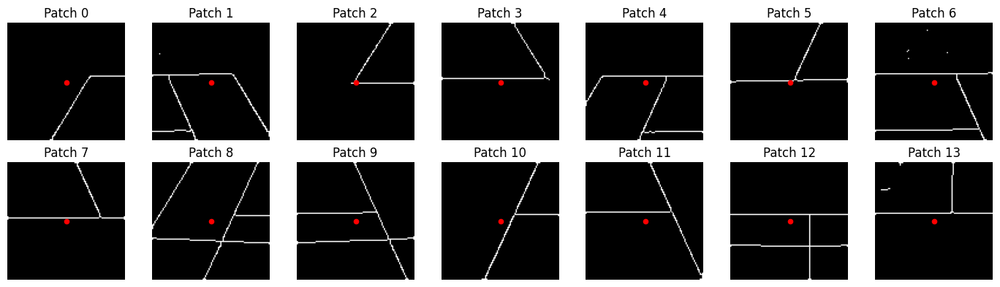

In [ ]:
plt.figure(figsize=(14, 4))

for i, crop in enumerate(crops):
    plt.subplot(2, 7, i + 1)

    # Preprocesado completo
    processed = preprocess_for_hough(crop)

    # Mostrar resultado
    plt.imshow(processed, cmap="gray")

    # Centro del patch
    h, w = processed.shape
    cx, cy = w // 2, h // 2
    plt.scatter(cx, cy, c="red", s=20)

    plt.title(f"Patch {i}")
    plt.axis("off")

plt.tight_layout()
plt.show()


## **HOUGH LINES**

Una vez tenemos la imagen preprocesada, se **calculan las líneas de la pista para poder calcular sus intersecciones**, que nos darán las **posiciones exactas de los keypoints**. Para ello utilizaremos la **transformada de Hough probabilistíca**.

La transformada de Hough probabilística (`HoughLinesP`) se utiliza para **detectar segmentos de línea recta en una imagen binaria**, incluso cuando las líneas están parcialmente interrumpidas o contienen ruido. Su funcionamiento se basa en **transformar el problema de detectar alineaciones de píxeles en el espacio de la imagen a un espacio de parámetros geométricos**, donde dichas **alineaciones** se vuelven **más fáciles de identificar**.

En este caso, la imagen de entrada ya ha sido preprocesada para resaltar las líneas de la pista y reducir el fondo, por lo que la transformada de Hough opera sobre una imagen binaria donde los **píxeles blancos representan posibles candidatos a formar líneas**. Cada píxel activado “vota” en un espacio de parámetros definido por la distancia $ρ$ al origen y el ángulo $\theta$ de la recta. Cuando un conjunto suficiente de píxeles **vota por la misma combinación de parámetros, se considera que existe una línea.**

La **versión probabilística** de Hough, a diferencia de la transformada clásica, **no evalúa todos los píxeles** de la imagen, sino que selecciona un **subconjunto aleatorio de ellos**, lo que **reduce significativamente el coste computacional**. Además, devuelve directamente **segmentos de línea finitos** definidos por sus puntos extremos, en lugar de **líneas infinitas**.

Los parámetros utilizados controlan el comportamiento del detector:
* **threshold**: define el **número mínimo de votos** necesarios para aceptar una línea
* **minLineLength**: establece la **longitud mínima** de un segmento para ser considerado válido, evitando detecciones muy cortas causadas por ruido.
* **maxLineGap**: permite **unir segmentos cercanos y colineales separados** por pequeños huecos.

En conjunto, esta etapa permite extraer de forma robusta los segmentos de línea que describen la geometría de la pista de tenis, incluso en presencia de ruido o discontinuidades.

In [ ]:
def detect_lines(image):
    pre = preprocess_for_hough(image)

    lines = cv2.HoughLinesP(
      pre,
      rho=1,
      theta=np.pi / 180,
      threshold=15,
      minLineLength=10,
      maxLineGap=15
    )
    lines = np.squeeze(lines)
    if len(lines.shape) > 0:
        if len(lines) == 4 and not isinstance(lines[0], np.ndarray):
            lines = [lines]
    else:
        lines = []
    return lines

`HoughLinesP` tiende a devolver **segmentos fragmentados porque trabaja sobre bordes discretos**, **líneas parcialmente discontinuas** y **regiones afectadas por ruido**.

Para arreglarlo se ha creado `merge_lines()`, que **agrupa y fusiona** los múltiples segmentos cortos devueltos por la transformada de Hough probabilística **para reconstruir líneas largas y coherentes** que representen las marcas reales de la pista de tenis.

El algoritmo recorre los segmentos detectados y los agrupa según dos criterios principales: **similitud angular y proximidad espacial**. Solo se fusionan segmentos con orientación similar (controlada por `angle_thresh`) y cuyos centros estén suficientemente cerca (`dist_thresh`), **evitando unir líneas paralelas distintas**. Una vez agrupados, **todos los extremos se proyectan sobre la dirección principal de la línea y se seleccionan los puntos más alejados para reconstruir un único segmento largo**, preservando la orientación original.

Gracias a este proceso conseguimos **líneas correctas y completas** con las que calcular las intersecciones correctamente.

In [ ]:
# función que junta las lineas detectadas por hough_lines para devolver simplemente dos lineas y calcular su punto de intersección
def merge_lines(lines, dist_thresh=25, angle_thresh=5):
    if len(lines) == 0:
        return []

    used = [False] * len(lines)
    merged = []

    for i, l1 in enumerate(lines):
        if used[i]:
            continue

        x1,y1,x2,y2 = l1
        angle1 = np.degrees(np.arctan2(y2-y1, x2-x1))

        pts = [(x1,y1), (x2,y2)]
        used[i] = True

        for j, l2 in enumerate(lines):
            if used[j]:
                continue

            x3,y3,x4,y4 = l2
            angle2 = np.degrees(np.arctan2(y4-y3, x4-x3))

            if abs(angle1 - angle2) > angle_thresh:
                continue

            # distancia mínima entre segmentos (aprox por centros)
            c1 = np.array([(x1+x2)/2, (y1+y2)/2])
            c2 = np.array([(x3+x4)/2, (y3+y4)/2])

            if np.linalg.norm(c1 - c2) > dist_thresh:
                continue

            pts.extend([(x3,y3), (x4,y4)])
            used[j] = True

        # reconstrucción colineal
        pts = np.array(pts, dtype=np.float32)

        # vector director
        v = np.array([np.cos(np.radians(angle1)), np.sin(np.radians(angle1))])

        # proyección escalar sobre la dirección
        proj = pts @ v

        p_min = pts[np.argmin(proj)]
        p_max = pts[np.argmax(proj)]

        merged.append([
            int(p_min[0]), int(p_min[1]),
            int(p_max[0]), int(p_max[1])
        ])

    return merged

In [ ]:
all_lines = []          # líneas detectadas por crop
all_merged_lines = []   # líneas fusionadas por crop

for i, crop in enumerate(crops):
    lines = detect_lines(crop)
    merged = merge_lines(lines)
    all_lines.append(lines)
    all_merged_lines.append(merged)

    print(f"Crop {i}: {len(lines)} líneas detectadas → {len(merged)} líneas fusionadas")

Crop 0: 3 líneas detectadas → 2 líneas fusionadas
Crop 1: 7 líneas detectadas → 5 líneas fusionadas
Crop 2: 3 líneas detectadas → 2 líneas fusionadas
Crop 3: 2 líneas detectadas → 2 líneas fusionadas
Crop 4: 5 líneas detectadas → 4 líneas fusionadas
Crop 5: 4 líneas detectadas → 3 líneas fusionadas
Crop 6: 5 líneas detectadas → 4 líneas fusionadas
Crop 7: 3 líneas detectadas → 2 líneas fusionadas
Crop 8: 5 líneas detectadas → 4 líneas fusionadas
Crop 9: 4 líneas detectadas → 3 líneas fusionadas
Crop 10: 2 líneas detectadas → 2 líneas fusionadas
Crop 11: 3 líneas detectadas → 2 líneas fusionadas
Crop 12: 3 líneas detectadas → 3 líneas fusionadas
Crop 13: 2 líneas detectadas → 2 líneas fusionadas


In [ ]:
# función que pinta lineas sobre la imagen de salida

def draw_lines(image, lines, color=(0, 255, 0), thickness=2):
    img = image.copy()
    for x1, y1, x2, y2 in lines:
        cv2.line(img, (x1, y1), (x2, y2), color, thickness)
    return img

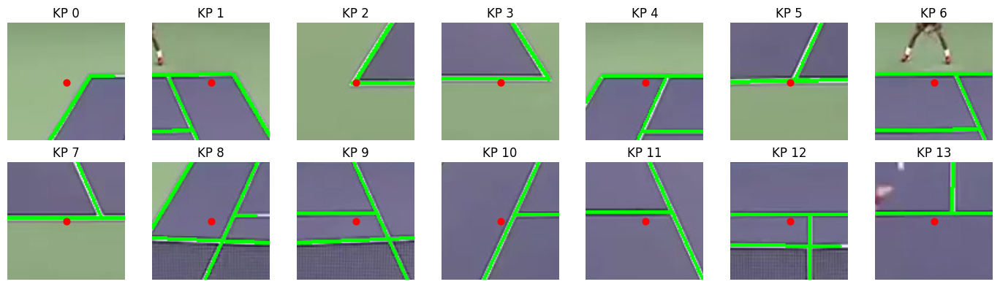

In [ ]:
plt.figure(figsize=(14, 4))

for i, crop in enumerate(crops):
    plt.subplot(2, 7, i + 1)

    merged = all_merged_lines[i]
    vis = draw_lines(crop, merged, color=(0, 255, 0))

    crop_rgb = cv2.cvtColor(vis, cv2.COLOR_BGR2RGB)
    plt.imshow(crop_rgb)


    h, w = crop.shape[:2]
    plt.scatter(w//2, h//2, c="red", s=40)

    plt.title(f"KP {i}")
    plt.axis("off")

plt.tight_layout()
plt.show()


## **HOUGH SIN PROCESADO**

Una vez aplicado el preprocesado adecuado, hemos comprobado que la Transformada de Hough se comporta de forma coherente y consistente. En cambio, **cuando este paso se omite y se aplica Hough** directamente sobre la imagen **solo aplicando Canny**, el algoritmo deja de discriminar entre estructura y textura, **interpretando el ruido**, las sombras y las variaciones suaves de intensidad como **posibles líneas y omitiendo lineas reales**. Para mostrar lo que sucedía hemos creado este pequeño experimento:


In [ ]:
# función que detecta las lineas sin preprocesado

def detect_lines_sin_pre(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # detección de bordes mediante canny
    edges = cv2.Canny(gray, 30, 50)

    # se aplica la transformada de hough probabilistica
    lines = cv2.HoughLinesP(
        edges,
        rho=1,
        theta=np.pi / 180,
        threshold=20,
        minLineLength=10,
        maxLineGap=5
    )

    if lines is None:
        return []

    lines = np.squeeze(lines)

    if lines.ndim == 1:
        lines = [lines.tolist()]

    return lines

In [ ]:
all_lines_pre = []
all_merged_lines_pre = []

for i, crop in enumerate(crops):
    lines = detect_lines_sin_pre(crop)
    merged = merge_lines(lines)

    all_lines_pre.append(lines)
    all_merged_lines_pre.append(merged)

    print(f"Crop {i}: {len(lines)} líneas detectadas → {len(merged)} líneas fusionadas")

Crop 0: 8 líneas detectadas → 2 líneas fusionadas
Crop 1: 15 líneas detectadas → 5 líneas fusionadas
Crop 2: 8 líneas detectadas → 2 líneas fusionadas
Crop 3: 6 líneas detectadas → 2 líneas fusionadas
Crop 4: 13 líneas detectadas → 5 líneas fusionadas
Crop 5: 8 líneas detectadas → 3 líneas fusionadas
Crop 6: 22 líneas detectadas → 9 líneas fusionadas
Crop 7: 8 líneas detectadas → 3 líneas fusionadas
Crop 8: 34 líneas detectadas → 10 líneas fusionadas
Crop 9: 49 líneas detectadas → 16 líneas fusionadas
Crop 10: 12 líneas detectadas → 4 líneas fusionadas
Crop 11: 9 líneas detectadas → 2 líneas fusionadas
Crop 12: 31 líneas detectadas → 8 líneas fusionadas
Crop 13: 7 líneas detectadas → 3 líneas fusionadas


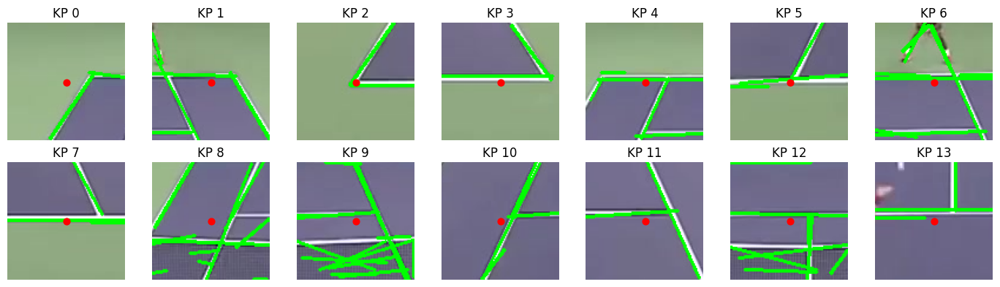

In [ ]:
plt.figure(figsize=(14, 4))

for i, crop in enumerate(crops):
    plt.subplot(2, 7, i + 1)

    merged = all_merged_lines_pre[i]
    vis = draw_lines(crop, merged, color=(0, 255, 0))

    crop_rgb = cv2.cvtColor(vis, cv2.COLOR_BGR2RGB)
    plt.imshow(crop_rgb)

    h, w = crop.shape[:2]
    plt.scatter(w//2, h//2, c="red", s=40)

    plt.title(f"KP {i}")
    plt.axis("off")

plt.tight_layout()
plt.show()

En este experimento se aprecia claramente la **importancia del preprocesado** en la detección de líneas mediante **Hough**. Cuando el preprocesador se aplica correctamente, las líneas detectadas son coherentes con la estructura real. Sin embargo, cuando este paso se omite, el **algoritmo comienza a comportarse de forma errática**: **se pierden líneas que deberían estar presentes** y, al mismo tiempo, se detectan **numerosas líneas incorrectas que no existen en la realidad**. Esto ocurre porque, sin un preprocesado adecuado, **Hough no distingue entre información estructural y ruido**, interpretando texturas, sombras o variaciones de intensidad como posibles alineaciones. Como resultado, la salida deja de ser geométricamente fiable y **pierde utilidad para cualquier etapa posterior** de ajuste, fusión o estimación precisa de la pista.


## **OBTENCIÓN DE LAS INTERSECCIONES**

Una vez que tenemos líneas correctas y geométricamente coherentes, el siguiente paso es analizar **dónde se cruzan dichas líneas**. Las intersecciones entre líneas representan **puntos estructurales muy estables** de la escena, como esquinas o cruces reales de las marcas de la pista, y por tanto constituyen **candidatos ideales para refinar la posición** del keypoint original. A diferencia de los puntos detectados inicialmente, que podían estar desplazados por ruido o por una detección incompleta de la CNN, las intersecciones se derivan directamente de la geometría global de las líneas y **son mucho más robustas**.

Por tanto, y a partir de los extremos de cada linea, la intersección $(x, y)$ se define matemáticamente como:

$$\begin{equation}
\begin{aligned}
x &= \frac{
(x_1 y_2 - y_1 x_2)(x_3 - x_4) - (x_1 - x_2)(x_3 y_4 - y_3 x_4)
}{
(x_1 - x_2)(y_3 - y_4) - (y_1 - y_2)(x_3 - x_4)
} \\
y &= \frac{
(x_1 y_2 - y_1 x_2)(y_3 - y_4) - (y_1 - y_2)(x_3 y_4 - y_3 x_4)
}{
(x_1 - x_2)(y_3 - y_4) - (y_1 - y_2)(x_3 - x_4)
}
\end{aligned}
\end{equation}$$


In [ ]:
# función que encuentra la interseccion (x, y) de dos lineas

def intersect(l1, l2):
    x1, y1, x2, y2 = l1
    x3, y3, x4, y4 = l2

    denom = (x1 - x2) * (y3 - y4) - (y1 - y2) * (x3 - x4)
    if denom == 0: return None

    px = int(((x1 * y2 - y1 * x2) * (x3 - x4) - (x1 - x2) * (x3 * y4 - y3 * x4)) / denom)
    py = int(((x1 * y2 - y1 * x2) * (y3 - y4) - (y1 - y2) * (x3 * y4 - y3 * x4)) / denom)

    return [px, py]

Dentro de un mismo *crop* pueden aparecer **varias intersecciones válidas**, ya que en muchos casos coexisten distintas estructuras lineales en una región reducida de la imagen. Este problema se manifiesta casi siempre en la zona de la **red**, que el **detector identifica como una línea más** (y de hecho lo es desde un punto de vista geométrico). A lo largo de las pruebas **no fue posible eliminar la red de forma fiable**: si se intentaba suprimirla mediante umbrales más estrictos o reduciendo el tamaño del *patch*, se llegaba a un punto en el que las propias líneas de la pista dejaban de detectarse correctamente. Ante esta limitación, se optó por una estrategia basada en la **proximidad al keypoint inicial**: cuando **existen varias intersecciones dentro de un mismo** *crop*, se **selecciona aquella que se encuentra más cerca del keypoint** detectado originalmente. Este criterio resulta sencillo pero efectivo, ya que el **keypoint inicial suele estar razonablemente próximo a la estructura correcta**. Aunque pueden darse errores puntuales si la detección de la red esta muy alejada, en la práctica este enfoque se comporta de manera robusta y proporciona una estimación fiable de la posición real del keypoint.


In [ ]:
import itertools

# función que calcula todas las intersecciones posibles entre pares de líneas y devuelve aquella
# intersección válida más cercana al centro del crop.

def closest_intersection_to_center(lines, crop_shape):
    if len(lines) < 2:
        return None

    # calculo del centro geométrico del crop
    h, w = crop_shape[:2]
    center = np.array([w / 2, h / 2], dtype=np.float32)

    intersections = []

    for l1, l2 in itertools.combinations(lines, 2):
        pt = intersect(l1, l2) # calculo de la interseccion
        if pt is None:
            continue

        # solo puntos dentro del crop
        if 0 <= pt[0] < w and 0 <= pt[1] < h:
            intersections.append(pt)

    if len(intersections) == 0:
        return None

    # elegir la más cercana al centro
    dists = [np.linalg.norm(pt - center) for pt in intersections]
    best_idx = np.argmin(dists)

    return intersections[best_idx]


### **REFINAMIENTO DE KEYPOINTS**

In [ ]:
refined_points = []

for i, crop in enumerate(crops):
    lines = detect_lines(crop) # detección de lineas con procesado
    merged = merge_lines(lines) # fusión de lineas

    pt = closest_intersection_to_center(merged, crop.shape) # intersecciones
    refined_points.append(pt)

    if pt is not None:
        print(f"Crop {i}: intersección refinada en {pt}")
    else:
        print(f"Crop {i}: sin intersección válida")

Crop 0: intersección refinada en [61, 45]
Crop 1: intersección refinada en [43, 46]
Crop 2: intersección refinada en [55, 50]
Crop 3: intersección refinada en [52, 51]
Crop 4: intersección refinada en [58, 45]
Crop 5: intersección refinada en [56, 48]
Crop 6: intersección refinada en [44, 47]
Crop 7: intersección refinada en [52, 51]
Crop 8: intersección refinada en [60, 44]
Crop 9: intersección refinada en [45, 46]
Crop 10: intersección refinada en [59, 45]
Crop 11: intersección refinada en [46, 47]
Crop 12: intersección refinada en [52, 46]
Crop 13: intersección refinada en [51, 46]


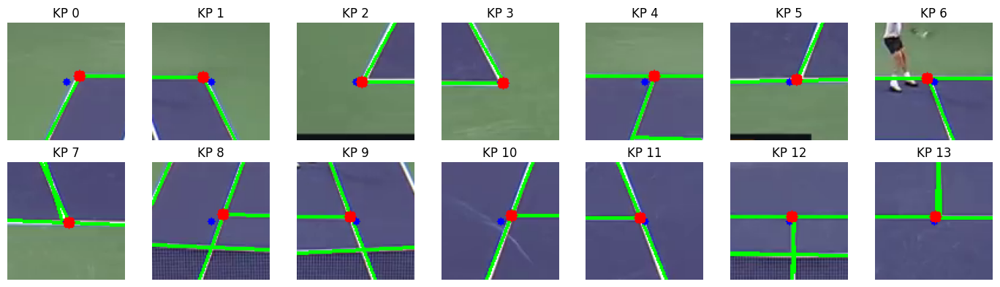

In [ ]:
plt.figure(figsize=(14, 4))

for i, crop in enumerate(crops):
    plt.subplot(2, 7, i + 1)

    vis = crop.copy()
    lines = merge_lines(detect_lines(crop))

    # dibujar líneas
    for x1, y1, x2, y2 in lines:
        cv2.line(vis, (x1, y1), (x2, y2), (0, 255, 0), 2)

    # centro del crop
    h, w = crop.shape[:2]
    cx, cy = w // 2, h // 2
    cv2.circle(vis, (cx, cy), 3, (255, 0, 0), -1)

    # intersección elegida
    pt = refined_points[i]
    if pt is not None:
        cv2.circle(vis, (int(pt[0]), int(pt[1])), 5, (0, 0, 255), -1)

    plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    plt.title(f"KP {i}")
    plt.axis("off")

plt.tight_layout()
plt.show()


En la figura se observa claramente que los **keypoints refinados**, situados en las **intersecciones de las líneas** (marcados en rojo), se encuentran mejor alineados con la geometría real de la pista que los **keypoints originales** (en azul). El refinamiento basado en intersecciones permite corregir desplazamientos producidos por ruido, detecciones incompletas o imprecisiones del detector inicial, anclando cada punto a una estructura geométrica estable y físicamente significativa. Como consecuencia, estos **keypoints refinados** presentan una **mayor coherencia espacial entre sí y una correspondencia más fiable con el modelo de la pista**. Por este motivo, serán los **keypoints rojos** los que se utilicen en adelante para calcular la **homografía** y realizar todos los cálculos geométricos posteriores.



---



Los keypoints refinados que se obtienen tras el análisis de cada *crop* están expresados en el **sistema de coordenadas local del parche**, es decir, su origen se encuentra en la esquina superior izquierda del *crop* y no en la imagen original. Sin embargo, para poder utilizarlos posteriormente en el cálculo de la homografía y en los ajustes geométricos globales, es **necesario expresar dichos puntos** en el **sistema de coordenadas de la imagen completa**. Para ello se realiza el **proceso inverso al recorte**: partiendo del centro del *crop* en coordenadas globales, se **corrige la posición del keypoint refinado** restando el desplazamiento relativo respecto al centro del parche (definido por la mitad del tamaño del *crop*). De este modo, cada punto refinado **se traslada** correctamente desde el sistema local del *crop* **al sistema global de la imagen original**, manteniendo su coherencia geométrica y permitiendo que todos los keypoints queden definidos en un marco común.





In [ ]:
refined_keypoints_global = []

half = crop_size / 2.0

for i, pt_crop in enumerate(refined_points):
    cx, cy = crop_centers[i]

    if pt_crop is None:
        # si no se pudo refinar  -> se usa el keypoint original
        refined_keypoints_global.append((cx, cy))
        continue

    x_crop, y_crop = pt_crop

    # CAMBIO DE SISTEMA (crop -> global)
    x_global = cx + (x_crop - half)
    y_global = cy + (y_crop - half)

    refined_keypoints_global.append((x_global, y_global))


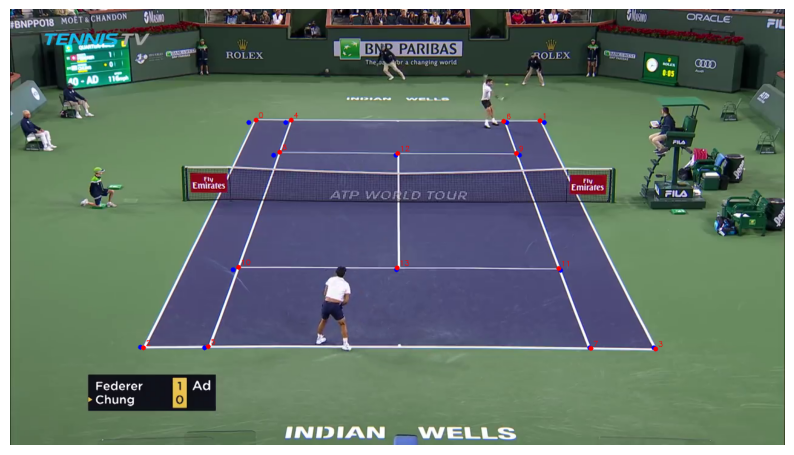

In [ ]:
vis = frame.copy()

for i, ((x0, y0), (xr, yr)) in enumerate(zip(pairs, refined_keypoints_global)):
    cv2.circle(vis, (int(x0), int(y0)), 4, (255, 0, 0), -1)   # azul
    cv2.circle(vis, (int(xr), int(yr)), 4, (0, 0, 255), -1)   # rojo
    cv2.putText(vis, str(i), (int(xr)+4, int(yr)-4),
                cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0,0,255), 1)

plt.figure(figsize=(10,6))
plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()


## **USO DE HOMOGRAFÍAS PARA EL TRAZADO DE LÍNEAS DE PISTA**

Una vez tenemos los keypoints detectados correctamente, se procede a **dibujar** correctamente **las líneas de la pista** encima de la imagen. Para ello haremos uso de **homografias** para **trasladar una imagen de referencia de una pista de tenis encima de los keypoints detectados**.

La creación de una homografía permite **establecer una relación geométrica** precisa entre la **imagen real** capturada por la cámara y un **modelo ideal de la pista de tenis** definido en un sistema de coordenadas conocido. Debido a la perspectiva proyectiva de la cámara, las líneas de la pista no aparecen paralelas ni con proporciones reales en la imagen, sino que sufren deformaciones que dependen de la posición y orientación de la cámara. La **homografía modela** exactamente esta **transformación proyectiva** y nos permitirá proyectar nuestra pista de referencia sobre la pista detectada.

La **pista de referencia** se construye **a partir de las dimensiones oficiales del tenis**, expresadas en unidades métricas y escaladas a píxeles. Esta es la plantilla que usaremos **para calcular la homografia y proyectar encima**.

Este proceso no solo sirve para visualizar la pista superpuesta, sino que es fundamental para tareas posteriores como por ejemplo establecer la posición correcta de los jgadores sobre la pista o calcular correctamente sus distancias en escala real.

In [ ]:
# función que crea el modelo de pista
def create_tennis_court_reference(scale=50, line_thickness=5):
    # dimensiones oficiales (metros)
    COURT_WIDTH  = 10.97
    COURT_HEIGHT = 23.77
    SINGLES_MARGIN = 1.37
    SERVICE_DIST = 6.40

    # se reescalana el ancho y alto
    W = int(COURT_WIDTH * scale)
    H = int(COURT_HEIGHT * scale)

    court = np.zeros((H, W), dtype=np.uint8)

    # función auxiliar para dibujar lineas
    def draw_line(p1, p2):
        pt1 = (int(p1[0] * scale), int(p1[1] * scale))
        pt2 = (int(p2[0] * scale), int(p2[1] * scale))
        cv2.line(court, pt1, pt2, 255, line_thickness)

    # perímetro y singles
    draw_line((0, 0), (0, COURT_HEIGHT))
    draw_line((COURT_WIDTH, 0), (COURT_WIDTH, COURT_HEIGHT))
    draw_line((0, 0), (COURT_WIDTH, 0))
    draw_line((0, COURT_HEIGHT), (COURT_WIDTH, COURT_HEIGHT))

    draw_line((SINGLES_MARGIN, 0), (SINGLES_MARGIN, COURT_HEIGHT))
    draw_line((COURT_WIDTH - SINGLES_MARGIN, 0), (COURT_WIDTH - SINGLES_MARGIN, COURT_HEIGHT))

    # red y cuadros de saque
    net_y = COURT_HEIGHT / 2
    draw_line((0, net_y), (COURT_WIDTH, net_y)) # red

    y_top = net_y - SERVICE_DIST
    y_bot = net_y + SERVICE_DIST

    # lineas horizontales de saque
    draw_line((SINGLES_MARGIN, y_top), (COURT_WIDTH - SINGLES_MARGIN, y_top))
    draw_line((SINGLES_MARGIN, y_bot), (COURT_WIDTH - SINGLES_MARGIN, y_bot))

    # linea central
    center_x = COURT_WIDTH / 2
    draw_line((center_x, y_top), (center_x, y_bot))

    # puntos de referencia (TL, TR, BR, BL)
    ref_pts = np.array([
        # 1–4: esquinas exteriores
        [0, 0],
        [COURT_WIDTH, 0],
        [0, COURT_HEIGHT],
        [COURT_WIDTH, COURT_HEIGHT],

        # 5–8: líneas de singles
        [SINGLES_MARGIN, 0],
        [SINGLES_MARGIN, COURT_HEIGHT],
        [COURT_WIDTH - SINGLES_MARGIN, 0],
        [COURT_WIDTH - SINGLES_MARGIN, COURT_HEIGHT],

        # 9–12: intersecciones líneas de saque
        [SINGLES_MARGIN, y_top],
        [COURT_WIDTH - SINGLES_MARGIN, y_top],
        [SINGLES_MARGIN, y_bot],
        [COURT_WIDTH - SINGLES_MARGIN, y_bot],

        # 13–14: centros de línea de saque
        [center_x, y_top],
        [center_x, y_bot],
    ], dtype=np.float32) * scale

    return court, ref_pts


Se genera y visualiza la plantilla de medidas de la pista y los puntos de referencia que se usarán para el calculo de correspondencias en la homografía posteriormente.[link text](https:// [link text](https://))

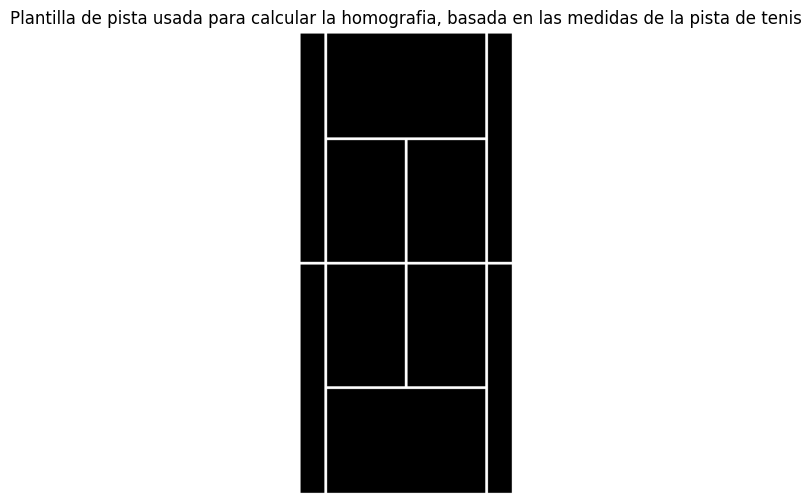

[[   0.         0.     ]
 [ 548.5        0.     ]
 [   0.      1188.5    ]
 [ 548.5     1188.5    ]
 [  68.5        0.     ]
 [  68.5     1188.5    ]
 [ 480.00003    0.     ]
 [ 480.00003 1188.5    ]
 [  68.5      274.25   ]
 [ 480.00003  274.25   ]
 [  68.5      914.25   ]
 [ 480.00003  914.25   ]
 [ 274.25     274.25   ]
 [ 274.25     914.25   ]]


In [ ]:
court_ref, points  =create_tennis_court_reference()
plt.figure(figsize=(10, 6))
plt.imshow(cv2.cvtColor(court_ref, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.title("Plantilla de pista usada para calcular la homografia, basada en las medidas de la pista de tenis")
plt.show()

print(points)

Tras obtener y visualizar la plantilla de medidas de la pista y los puntos de referencia que se usarán para el calculo de correspondencias en la homografía posteriormente, se define la función `compute_homography()`, que calcula la matriz de transformación (**homografía**) necesaria para **proyectar el modelo plano de la pista sobre la perspectiva inclinada de la imagen**.

La clave de su robustez reside en el uso del algoritmo **RANSAC**, diseñado específicamente para **filtrar errores**. En lugar de intentar ajustar la proyección utilizando todos los puntos detectados a la vez, el algoritmo **selecciona repetidamente subconjuntos aleatorios** de **solo cuatro puntos** para generar múltiples hipótesis de transformación.

En cada iteración, **RANSAC** prueba la hipótesis generada contra el resto de los puntos: si un punto encaja geométricamente con el modelo temporal (según el umbral de 5 píxeles), se considera válido (inlier); si queda lejos, se marca como ruido (outlier). Gracias a eso conseguimso un buen ajuste aunque no todos los keypoints se hayan calculado correctamente. **Aunque no evita que falle si hay mucho errores**.

In [ ]:
# función que calcula la homografia entre los puntos encontrados y los puntos de la pista de referencia

def compute_homography(image_points, ref_points):
    H, mask = cv2.findHomography(
        ref_points,
        image_points,
        cv2.RANSAC,
        ransacReprojThreshold=5.0
    )
    return H

Una vez definido el cálculo de la homografía, se define `overlay_court()`, que se encarga de **proyectar la pista de referencia sobre la imagen original utilizando la homografía** previamente estimada, permitiendo visualizar la alineación entre el modelo geométrico ideal de la pista y la escena real capturada por la cámara.

En primer lugar, la **imagen de la pista de referencia** se transforma mediante `cv2.warpPerspective`, que aplica la **homografía** H para **mapear el modelo de pista desde su sistema de coordenadas** propio al plano de la imagen real.

A continuación, se crea una copia de la imagen original y se genera una **máscara** a partir de la pista proyectada. Se emplea un **umbral bajo para capturar no solo los píxeles completamente blancos**, sino **también** aquellos que, debido a la interpolación y a la perspectiva, **aparecen atenuados o ligeramente difuminados**. Esto garantiza que las líneas proyectadas no se pierdan en regiones alejadas de la cámara.

Finalmente, los píxeles correspondientes a la pista proyectada se dibujan sobre la imagen original en un color distintivo, permitiendo una inspección visual clara de la calidad de la homografía.

In [ ]:
def overlay_court(image, court_ref, H):
    warped = cv2.warpPerspective(
        court_ref,
        H,
        (image.shape[1], image.shape[0]),
        flags=cv2.INTER_CUBIC
    )

    overlay = image.copy()

    # umbral bajo para captar líneas que quedaron grises/tenues por la lejanía
    mask = warped > 10
    overlay[mask] = (0, 255, 255)

    return overlay

Para finalizar y validar el pipeline, calculamos la homografia y aplicamos las tranformaciones para aplicar la pista sobre la imagen final.

Usando 14 puntos para homografía


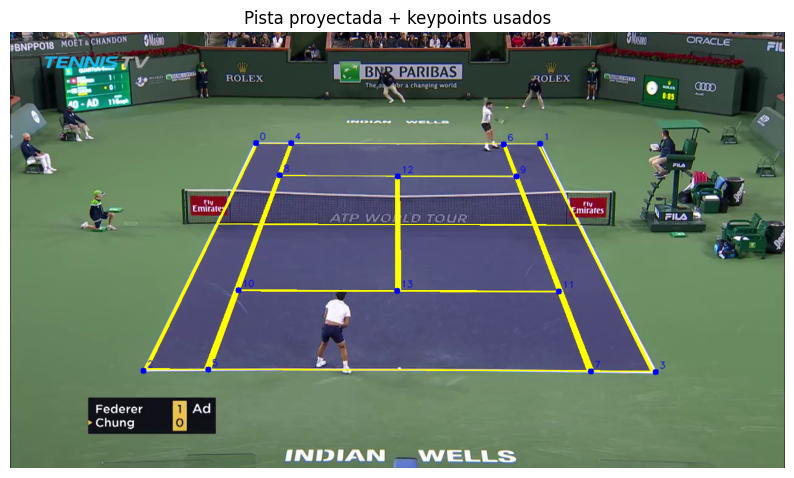

In [ ]:
img_pts = []
ref_pts_valid = []

for kp_img, kp_ref in zip(refined_keypoints_global, points):
    if kp_img is None:
        continue

    img_pts.append(kp_img)
    ref_pts_valid.append(kp_ref)

img_pts = np.array(img_pts, dtype=np.float32)
ref_pts_valid = np.array(ref_pts_valid, dtype=np.float32)

print("Usando", len(img_pts), "puntos para homografía")


H = compute_homography(
    image_points=img_pts,
    ref_points=ref_pts_valid
)


court_ref, ref_pts_all = create_tennis_court_reference(
    scale=50,
    line_thickness=5
)


overlay = overlay_court(
    image=frame,
    court_ref=court_ref,
    H=H
)


# Copia para dibujar
vis = overlay.copy()

# Dibujar keypoints usados
for i, pt in enumerate(refined_keypoints_global):
    if pt is None:
        continue

    x, y = pt
    x, y = int(round(x)), int(round(y))
    cv2.circle(vis, (x, y), 5, (255, 0, 0), -1)
    cv2.putText(
        vis,
        str(i),
        (x + 6, y - 6),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.5,
        (255, 0, 0),
        1,
        cv2.LINE_AA
    )

# --- Mostrar ---
plt.figure(figsize=(10, 6))
plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.title("Pista proyectada + keypoints usados")
plt.show()

Como podemos observar el resultado final es muy bueno, confirmando la calidad de todo el proceso.

## **PIPELINE COMPLETO**

Para facilitar el cálculo de las líneas y la homografia en otros apartados de la práćtica se ha creado una **función que realice todo el proceso de cálculo de keypoints, refinamiento, cálculo de la homografia y su correspondiente aplicación**.

Un resumen del proceso completo seria:

En primer lugar, la imagen se carga y se procesa mediante un detector de líneas de pista basado en aprendizaje profundo, que proporciona una **estimación inicial de los keypoints más relevantes de la pista**. Estos puntos iniciales sirven como aproximación gruesa de la geometría de la escena.

A continuación, **cada keypoint se refina** localmente mediante un análisis clásico de visión por computador. Para ello, se extrae un recorte centrado en cada punto, se detectan líneas con la transformada de Hough y se fusionan los segmentos colineales para estimar intersecciones precisas. Este **refinado corrige errores de localización del modelo profundo y mejora la precisión geométrica de los puntos clave**, que posteriormente **se transforman** de nuevo **al sistema de coordenadas global de la imagen**.

Con los keypoints refinados, se **construye un modelo de referencia de la pista de tenis basado en sus dimensiones oficiales**. Se establecen **correspondencias directas entre los puntos detectados en la imagen y los puntos del modelo ideal**, lo que permite **estimar una homografía que describe la transformación proyectiva** entre ambos planos.

Finalmente, dicha homografía se utiliza para proyectar la pista de referencia sobre la imagen original y visualizar tanto la alineación de la pista como la posición final de los keypoints. Este enfoque híbrido combina aprendizaje profundo y geometría clásica para lograr una localización robusta y precisa de la pista de tenis.

In [ ]:
def process_court_image(image_path, model_path, crop_size = 100 , line_thickness = 5):
    image_bgr = cv2.imread(image_path)
    if image_bgr is None:
        print(f"Error: Unable to load image from {image_path}")
        return None

    h, w = image_bgr.shape[:2]

    detector = CourtLineDetector(model_path)
    initial_keypoints_flat = detector.predict(image_bgr)

    # se convierte initial_keypoints en parejas (x, y)
    initial_keypoint_pairs = initial_keypoints_flat.reshape(-1, 2)

    crops = []
    crop_centers = []
    refined_points_local = []

    # por cada (x, y), se refina el kp
    for i, (x, y) in enumerate(initial_keypoint_pairs):
        cx = int(round(x))
        cy = int(round(y))

        crop = crop_square(image_bgr, cx, cy, crop_size)
        crops.append(crop)
        crop_centers.append((cx, cy))

        lines = detect_lines(crop)
        merged_lines = merge_lines(lines)
        pt_local_refined = closest_intersection_to_center(merged_lines, crop.shape)
        refined_points_local.append(pt_local_refined)

    # conversión de coordenadas a sistema global
    refined_keypoints_global_list = []
    half_crop_size = crop_size / 2.0

    for i, pt_crop in enumerate(refined_points_local):
        cx, cy = crop_centers[i]
        if pt_crop is None:
            x_global = initial_keypoint_pairs[i][0]
            y_global = initial_keypoint_pairs[i][1]
        else:
            x_crop, y_crop = pt_crop
            x_global = cx + (x_crop - half_crop_size)
            y_global = cy + (y_crop - half_crop_size)

        refined_keypoints_global_list.append((x_global, y_global))

    refined_keypoints_global = np.array(refined_keypoints_global_list, dtype=np.float32)

    # se genera la pista de referencia de tenis
    court_ref_img, ref_points_coords = create_tennis_court_reference(scale=50, line_thickness = line_thickness)

    img_pts = []
    ref_pts_valid = []

    for i in range(len(refined_keypoints_global)):
        img_pts.append(refined_keypoints_global[i])
        ref_pts_valid.append(ref_points_coords[i])

    img_pts = np.array(img_pts, dtype=np.float32)
    ref_pts_valid = np.array(ref_pts_valid, dtype=np.float32)


    # se calcula la homografia
    H = compute_homography(image_points=img_pts, ref_points=ref_pts_valid)

    processed_image = overlay_court(image=image_bgr, court_ref=court_ref_img, H=H)

    # se dibujan los kp refinados en la imagen
    for i, pt in enumerate(refined_keypoints_global_list):
        x, y = pt
        x, y = int(round(x)), int(round(y))

        cv2.circle(processed_image, (x, y), 5, (0, 0, 255), -1)
        cv2.putText(
            processed_image,
            str(i),
            (x + 6, y - 6),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.5,
            (0, 0, 255),
            1,
            cv2.LINE_AA
        )

    return processed_image, refined_keypoints_global , H

## **PRUEBA FINAL**

Para acabar de asegurarnos del correcto funcionamiento del proceso, se han realizado pruebas con videos obtenidos de otro **dataset distinto** del usado en el entrenamieto y validación del proceso.

Processing random image: data/tracknet/Dataset/game1/Clip1/0079.jpg
Initial keypoints predicted for data/tracknet/Dataset/game1/Clip1/0079.jpg
Keypoints refined and translated to global coordinates.
Tennis court reference model generated.
Using 14 points for homography computation.
Homography matrix computed.
Court reference overlaid onto the image.
Refined keypoints drawn on the final image.


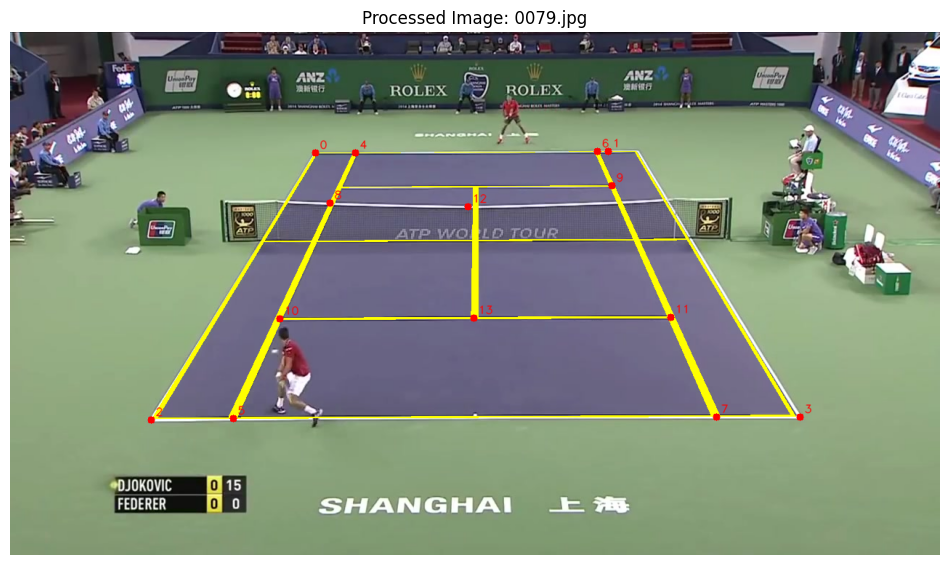

Processing random image: data/tracknet/Dataset/game1/Clip1/0190.jpg
Initial keypoints predicted for data/tracknet/Dataset/game1/Clip1/0190.jpg
Keypoints refined and translated to global coordinates.
Tennis court reference model generated.
Using 14 points for homography computation.
Homography matrix computed.
Court reference overlaid onto the image.
Refined keypoints drawn on the final image.


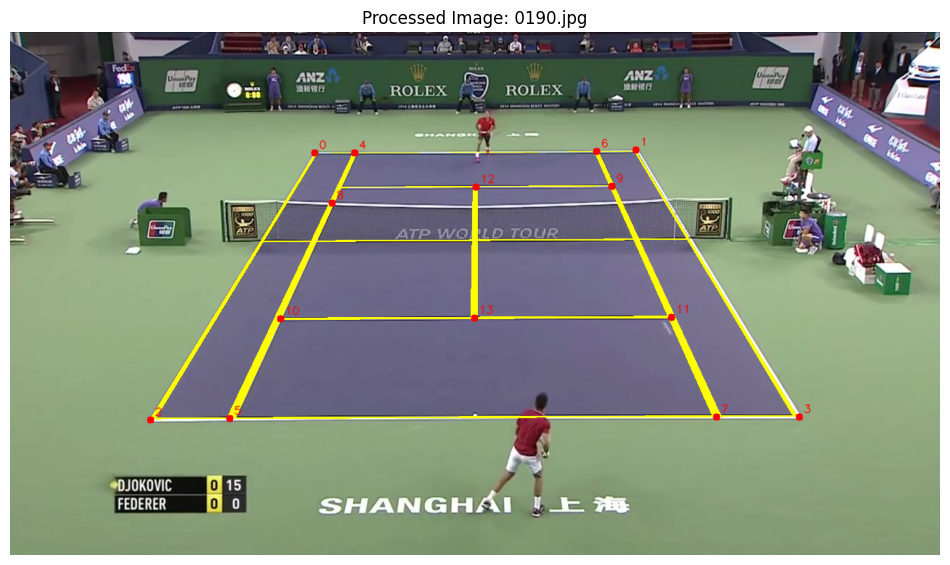

Processing random image: data/tracknet/Dataset/game1/Clip1/0124.jpg
Initial keypoints predicted for data/tracknet/Dataset/game1/Clip1/0124.jpg
Keypoints refined and translated to global coordinates.
Tennis court reference model generated.
Using 14 points for homography computation.
Homography matrix computed.
Court reference overlaid onto the image.
Refined keypoints drawn on the final image.


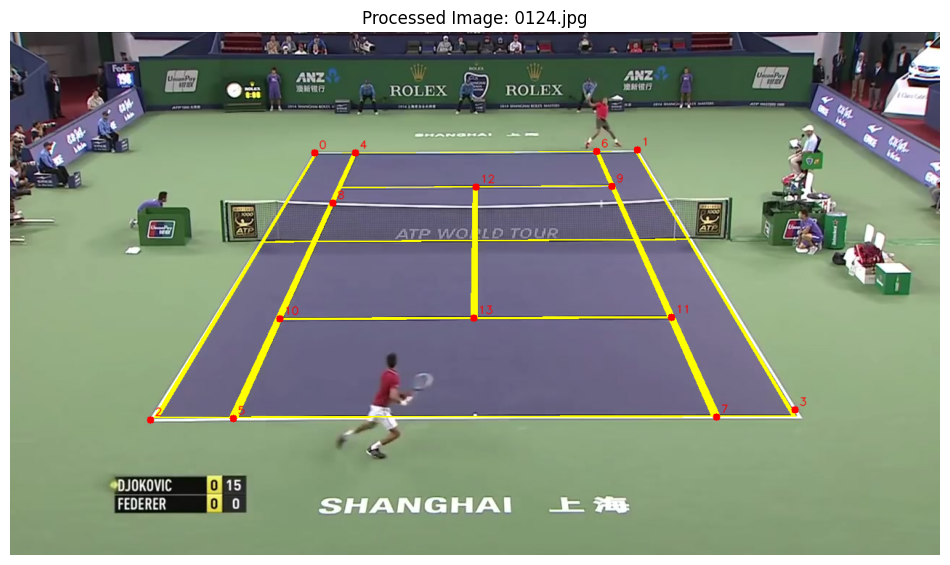

Processing random image: data/tracknet/Dataset/game1/Clip1/0155.jpg
Initial keypoints predicted for data/tracknet/Dataset/game1/Clip1/0155.jpg
Keypoints refined and translated to global coordinates.
Tennis court reference model generated.
Using 14 points for homography computation.
Homography matrix computed.
Court reference overlaid onto the image.
Refined keypoints drawn on the final image.


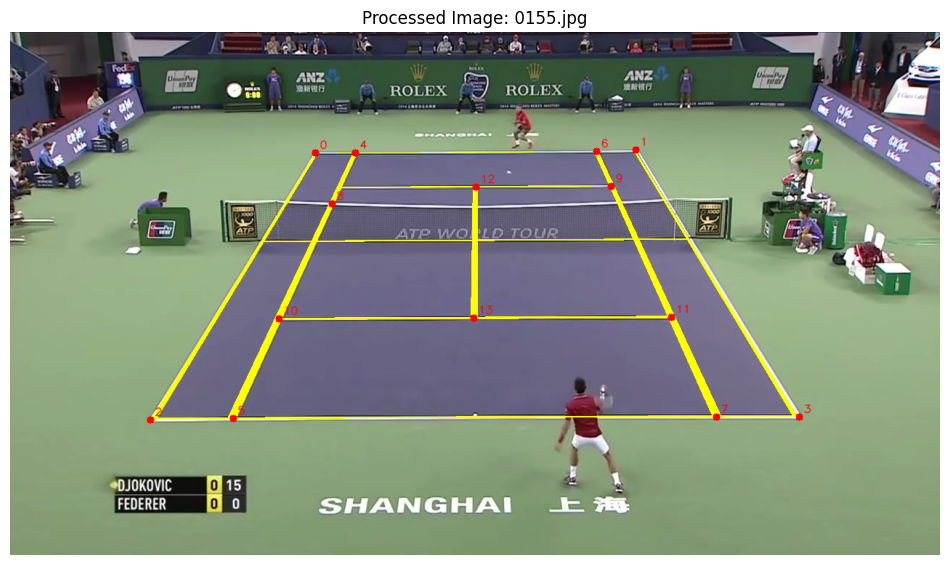

Processing random image: data/tracknet/Dataset/game1/Clip1/0138.jpg
Initial keypoints predicted for data/tracknet/Dataset/game1/Clip1/0138.jpg
Keypoints refined and translated to global coordinates.
Tennis court reference model generated.
Using 14 points for homography computation.
Homography matrix computed.
Court reference overlaid onto the image.
Refined keypoints drawn on the final image.


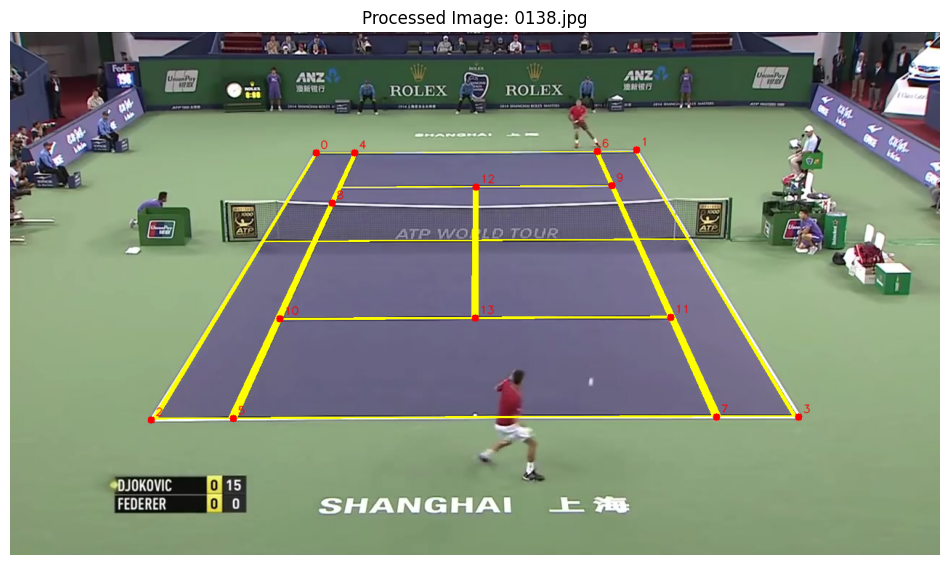

In [ ]:
image_dir = "data/tracknet/Dataset/game1/Clip1"
all_image_files = [os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.endswith('.jpg')]

for i in range(5):
  if all_image_files:
      random_image_path = random.choice(all_image_files)
      print(f"Processing random image: {random_image_path}")

      processed_output_image = process_court_image(random_image_path,"drive/MyDrive/model_court.pth",crop_size = 110)

      if processed_output_image is not None:
          plt.figure(figsize=(12, 8))
          plt.imshow(cv2.cvtColor(processed_output_image, cv2.COLOR_BGR2RGB))
          plt.title(f"Processed Image: {os.path.basename(random_image_path)}")
          plt.axis("off")
          plt.show()
      else:
          print(f"Failed to process image: {random_image_path}")
  else:
      print("No image files found in the directory.")

Como se puede observar, el algoritmo **detecta correctamente** todos los keypoints demostrando un buen rendimiento.

Es de destacar que, a pesar del buen funcionamiento en gran variedad de pistas, el sistema se encuentra con **dificultades sobretodo en imagenes de pistas de tierra**, en las que las **líneas tienden a camuflarse entre la tierra y se pierden los keypoints**. Otros escenarios en el que falla el sistema es para casos en el que **ángulo de la cámara es demasiado bajo**, difuminando casi a cero las líneas más alejadas.

A pesar de todo esto el funcionamiento del sistema es relativamente **robusto gracias al uso de RANSAC** al calcular la homografía, ya que permite un buen ajuste de las líneas a pesar de que nos equivoquemos encontrando algunos keypoints.

## **PRUEBAS EXTRA**

A partir de aquí tenemos algunas pruebas extras que utilizamos para acabar de **ajustar algunos parametros como el tamaño del crop**.

Estos códigos nos han ayudado a visualizar mejor los errores de nuestro código y acabar de refinarlo. Las versiones vistas anteriormente ya tienen estos parametros ajustados correctamente, por lo que hemos dejado las pruebas como mera curiosidad.

En ella se observa mejor el ajuste correcto de los keypoints entre la versión que devuelve la red y el ajuste previo con herramientas de visión por computador más clásicas.

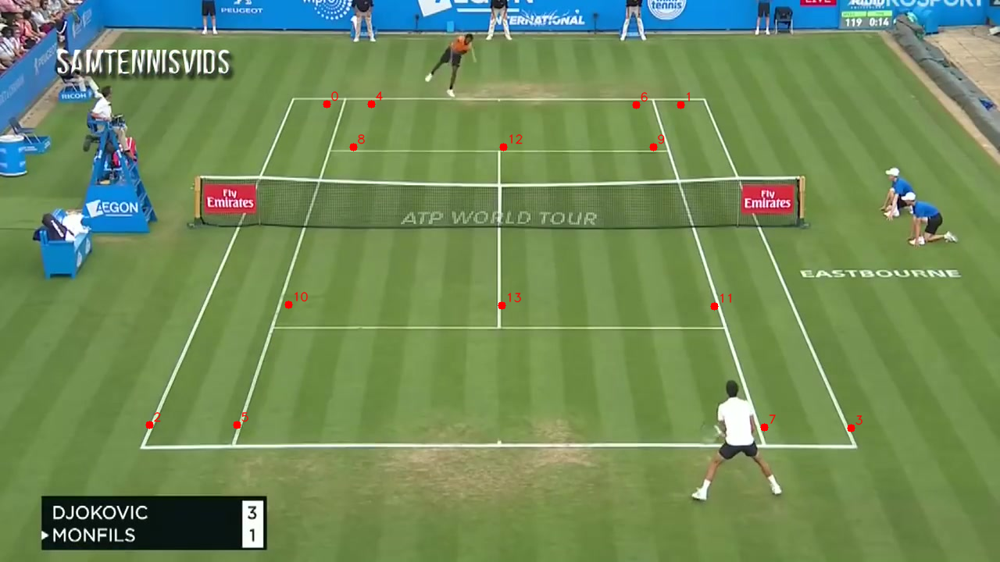

-1

In [ ]:
from google.colab.patches import cv2_imshow

detector = CourtLineDetector("drive/MyDrive/model_court.pth")

frame = cv2.imread("data/tracknet/Dataset/game2/Clip8/0000.jpg")
h,w = frame.shape[:2]
frame_480 = cv2.resize(frame, (480, 480))
keypoints = detector.predict(frame)
out = detector.draw_keypoints(frame.copy(), keypoints)
cv2_imshow(out)
cv2.waitKey(0)

In [ ]:
pairs = np.array(keypoints).reshape(-1, 2)
print(pairs)

[[ 418.01593  133.35822]
 [ 871.11975  134.50018]
 [ 191.238    544.03973]
 [1089.4546   548.04254]
 [ 475.08984  133.48294]
 [ 303.34534  544.6498 ]
 [ 814.86426  134.6242 ]
 [ 978.45654  547.4533 ]
 [ 452.95392  188.01126]
 [ 836.5092   188.54193]
 [ 369.92465  390.6913 ]
 [ 914.6405   392.10562]
 [ 644.72626  188.4171 ]
 [ 642.52057  391.854  ]]


In [ ]:
crops = []
crop_centers = []
crop_size = 120  # píxeles

for i, (x, y) in enumerate(pairs):
    cx = int(round(x))
    cy = int(round(y))

    crop = crop_square(frame, cx, cy, crop_size)
    crops.append(crop)
    crop_centers.append((cx, cy))

    print(f"Keypoint {i}: center=({cx}, {cy}), crop shape={crop.shape}")

Keypoint 0: center=(418, 133), crop shape=(120, 120, 3)
Keypoint 1: center=(871, 135), crop shape=(120, 120, 3)
Keypoint 2: center=(191, 544), crop shape=(120, 120, 3)
Keypoint 3: center=(1089, 548), crop shape=(120, 120, 3)
Keypoint 4: center=(475, 133), crop shape=(120, 120, 3)
Keypoint 5: center=(303, 545), crop shape=(120, 120, 3)
Keypoint 6: center=(815, 135), crop shape=(120, 120, 3)
Keypoint 7: center=(978, 547), crop shape=(120, 120, 3)
Keypoint 8: center=(453, 188), crop shape=(120, 120, 3)
Keypoint 9: center=(837, 189), crop shape=(120, 120, 3)
Keypoint 10: center=(370, 391), crop shape=(120, 120, 3)
Keypoint 11: center=(915, 392), crop shape=(120, 120, 3)
Keypoint 12: center=(645, 188), crop shape=(120, 120, 3)
Keypoint 13: center=(643, 392), crop shape=(120, 120, 3)


In [ ]:
all_lines = []          # líneas detectadas por crop
all_merged_lines = []   # líneas fusionadas por crop

for i, crop in enumerate(crops):
    lines = detect_lines(crop)
    merged = merge_lines(lines)
    all_lines.append(lines)
    all_merged_lines.append(merged)

    print(f"Crop {i}: {len(lines)} líneas detectadas → {len(merged)} líneas fusionadas")

Crop 0: 4 líneas detectadas → 4 líneas fusionadas
Crop 1: 6 líneas detectadas → 5 líneas fusionadas
Crop 2: 3 líneas detectadas → 2 líneas fusionadas
Crop 3: 3 líneas detectadas → 2 líneas fusionadas
Crop 4: 2 líneas detectadas → 2 líneas fusionadas
Crop 5: 3 líneas detectadas → 3 líneas fusionadas
Crop 6: 4 líneas detectadas → 4 líneas fusionadas
Crop 7: 7 líneas detectadas → 6 líneas fusionadas
Crop 8: 7 líneas detectadas → 6 líneas fusionadas
Crop 9: 6 líneas detectadas → 5 líneas fusionadas
Crop 10: 3 líneas detectadas → 2 líneas fusionadas
Crop 11: 3 líneas detectadas → 3 líneas fusionadas
Crop 12: 5 líneas detectadas → 4 líneas fusionadas
Crop 13: 2 líneas detectadas → 2 líneas fusionadas


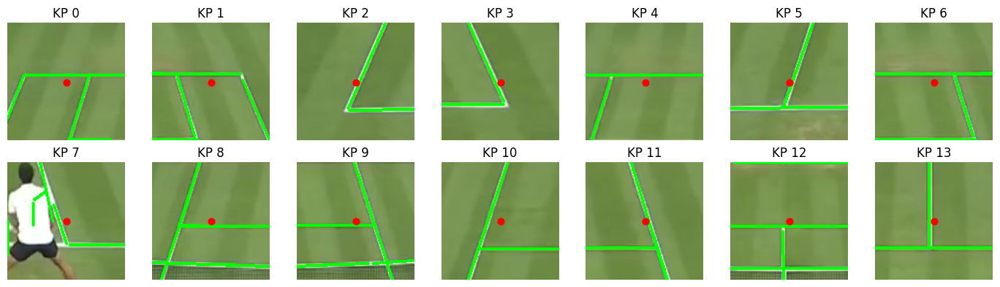

In [ ]:
plt.figure(figsize=(14, 4))

for i, crop in enumerate(crops):
    plt.subplot(2, 7, i + 1)

    merged = all_merged_lines[i]
    vis = draw_lines(crop, merged, color=(0, 255, 0))

    crop_rgb = cv2.cvtColor(vis, cv2.COLOR_BGR2RGB)
    plt.imshow(crop_rgb)


    h, w = crop.shape[:2]
    plt.scatter(w//2, h//2, c="red", s=40)

    plt.title(f"KP {i}")
    plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
refined_points = []

for i, crop in enumerate(crops):
    lines = detect_lines(crop)
    merged = merge_lines(lines)

    pt = closest_intersection_to_center(merged, crop.shape)
    refined_points.append(pt)

    if pt is not None:
        print(f"Crop {i}: intersección refinada en {pt}")
    else:
        print(f"Crop {i}: sin intersección válida")

Crop 0: intersección refinada en [83, 53]
Crop 1: intersección refinada en [89, 52]
Crop 2: intersección refinada en [51, 89]
Crop 3: intersección refinada en [64, 83]
Crop 4: intersección refinada en [26, 53]
Crop 5: intersección refinada en [55, 86]
Crop 6: intersección refinada en [79, 51]
Crop 7: intersección refinada en [60, 84]
Crop 8: intersección refinada en [27, 64]
Crop 9: intersección refinada en [78, 64]
Crop 10: intersección refinada en [37, 88]
Crop 11: intersección refinada en [72, 87]
Crop 12: intersección refinada en [53, 65]
Crop 13: intersección refinada en [55, 87]


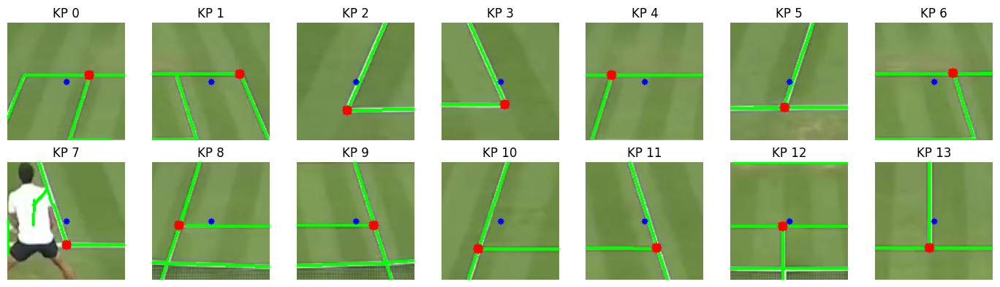

In [ ]:
plt.figure(figsize=(14, 4))

for i, crop in enumerate(crops):
    plt.subplot(2, 7, i + 1)

    vis = crop.copy()
    lines = merge_lines(detect_lines(crop))

    # dibujar líneas
    for x1, y1, x2, y2 in lines:
        cv2.line(vis, (x1, y1), (x2, y2), (0, 255, 0), 2)

    # centro del crop
    h, w = crop.shape[:2]
    cx, cy = w // 2, h // 2
    cv2.circle(vis, (cx, cy), 3, (255, 0, 0), -1)

    # intersección elegida
    pt = refined_points[i]
    if pt is not None:
        cv2.circle(vis, (int(pt[0]), int(pt[1])), 5, (0, 0, 255), -1)

    plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    plt.title(f"KP {i}")
    plt.axis("off")

plt.tight_layout()
plt.show()